# References

https://www.kaggle.com/code/devajitpatar/gan-generative-adversarial-networks-in-mnist-data

https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-an-mnist-handwritten-digits-from-scratch-in-keras/

https://www.youtube.com/watch?v=_pIMdDWK5sc

# Libraries

In [ ]:
!pip install torch torchvision matplotlib

In [16]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import pickle

In [30]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize

In [31]:
batch_size = 100
z_dim = 100
learning_rate = 0.0001
num_epochs = 50
num_classes = 10

In [32]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

In [33]:
# MNIST
mnist = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
data_loader = DataLoader(dataset=mnist, batch_size=batch_size, shuffle=True)

In [34]:
data_iter = iter(data_loader)
images, labels = next(data_iter)

print(images.shape)
print(labels.shape)
print(labels[:20])

torch.Size([100, 1, 28, 28])
torch.Size([100])
tensor([3, 8, 5, 9, 6, 6, 1, 8, 0, 6, 1, 1, 3, 1, 0, 5, 4, 0, 8, 2])


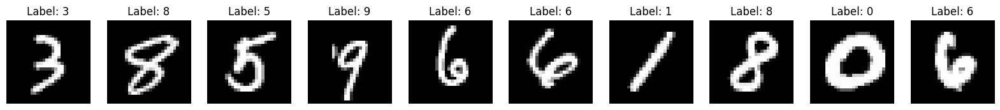

In [35]:
fig, axes = plt.subplots(1, 10, figsize=(20, 4))
for i in range(10):
    axes[i].imshow(images[i].squeeze(0), cmap='gray')
    axes[i].set_title(f'Label: {labels[i].item()}')
    axes[i].axis('off')

plt.show()

# Model

## Generator

In [42]:
class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim, num_classes):
        super(ConditionalGenerator, self).__init__()
        self.label_emb = nn.Embedding(num_classes, z_dim)
        self.model = nn.Sequential(
            nn.Linear(z_dim * 2, 128),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(128, 256),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.1),
            nn.Linear(1024, 28*28),
            nn.Tanh()
        )

    def forward(self, z, labels):
        label_embedding = self.label_emb(labels)
        gen_input = torch.cat((z, label_embedding), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), 1, 28, 28)
        return img


## Discriminator

In [43]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self, num_classes):
        super(ConditionalDiscriminator, self).__init__()
        self.label_emb = nn.Embedding(num_classes, 28*28)
        self.model = nn.Sequential(
            nn.Linear(28*28 * 2, 1024),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(256, 128),
            nn.LeakyReLU(0.1),
            nn.Dropout(0.2),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        label_embedding = self.label_emb(labels)
        d_input = torch.cat((img.view(img.size(0), -1), label_embedding), -1)
        validity = self.model(d_input)
        return validity


## Model Training

In [44]:
generator = ConditionalGenerator(z_dim, num_classes).to(device)
discriminator = ConditionalDiscriminator(num_classes).to(device)

In [45]:
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))

In [46]:
'''
    Q4: 10x10 grid
'''
def generate_and_display(generator, num_images=100, z_dim=100):
    z = torch.randn(num_images, z_dim).to(device)
    labels = torch.randint(0, num_classes, (num_images,)).to(device)
    with torch.no_grad():
        fake_images = generator(z, labels)

    fake_images = (fake_images + 1) / 2
    fig, axes = plt.subplots(10, 10, figsize=(10, 10))
    fig.suptitle("Generated Fake Digits", fontsize=16)
    axes = axes.flatten()

    for i in range(num_images):
        img = fake_images[i].cpu().numpy().transpose(1, 2, 0).squeeze()
        label = labels[i].item()
        axes[i].imshow(img, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f'Label: {label}')

    plt.tight_layout()
    plt.show()

Epoch [1/50], Step [200/600], d_loss: 1.1887, g_loss: 3.5379, D(x): 0.89, D(G(z)): 0.61
Epoch [1/50], Step [400/600], d_loss: 0.6090, g_loss: 2.2653, D(x): 0.84, D(G(z)): 0.29
Epoch [1/50], Step [600/600], d_loss: 0.4311, g_loss: 2.5967, D(x): 0.84, D(G(z)): 0.10
Epoch [1/50], Average d_loss: 0.8145, Average g_loss: 1.9082


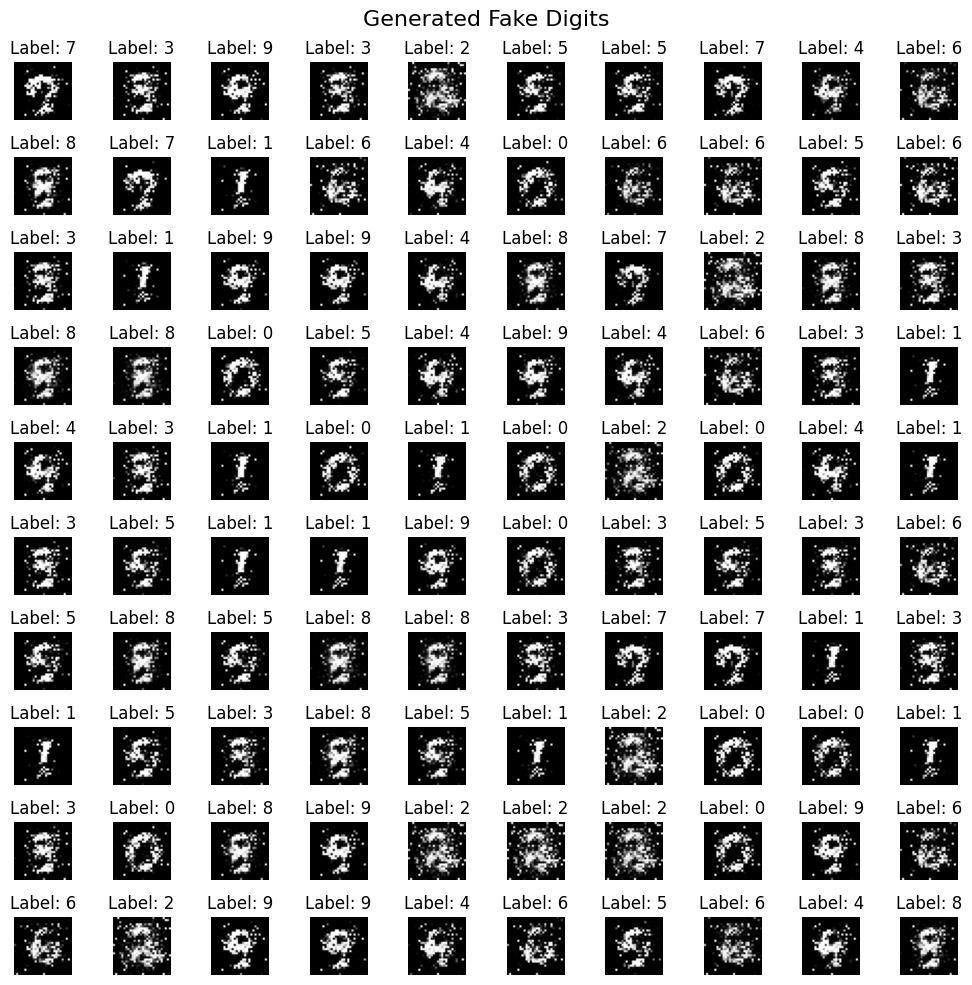

Epoch [2/50], Step [200/600], d_loss: 0.3289, g_loss: 2.5563, D(x): 0.86, D(G(z)): 0.06
Epoch [2/50], Step [400/600], d_loss: 0.2379, g_loss: 3.1133, D(x): 0.89, D(G(z)): 0.04
Epoch [2/50], Step [600/600], d_loss: 0.4731, g_loss: 2.3171, D(x): 0.91, D(G(z)): 0.23
Epoch [2/50], Average d_loss: 0.4457, Average g_loss: 2.9392


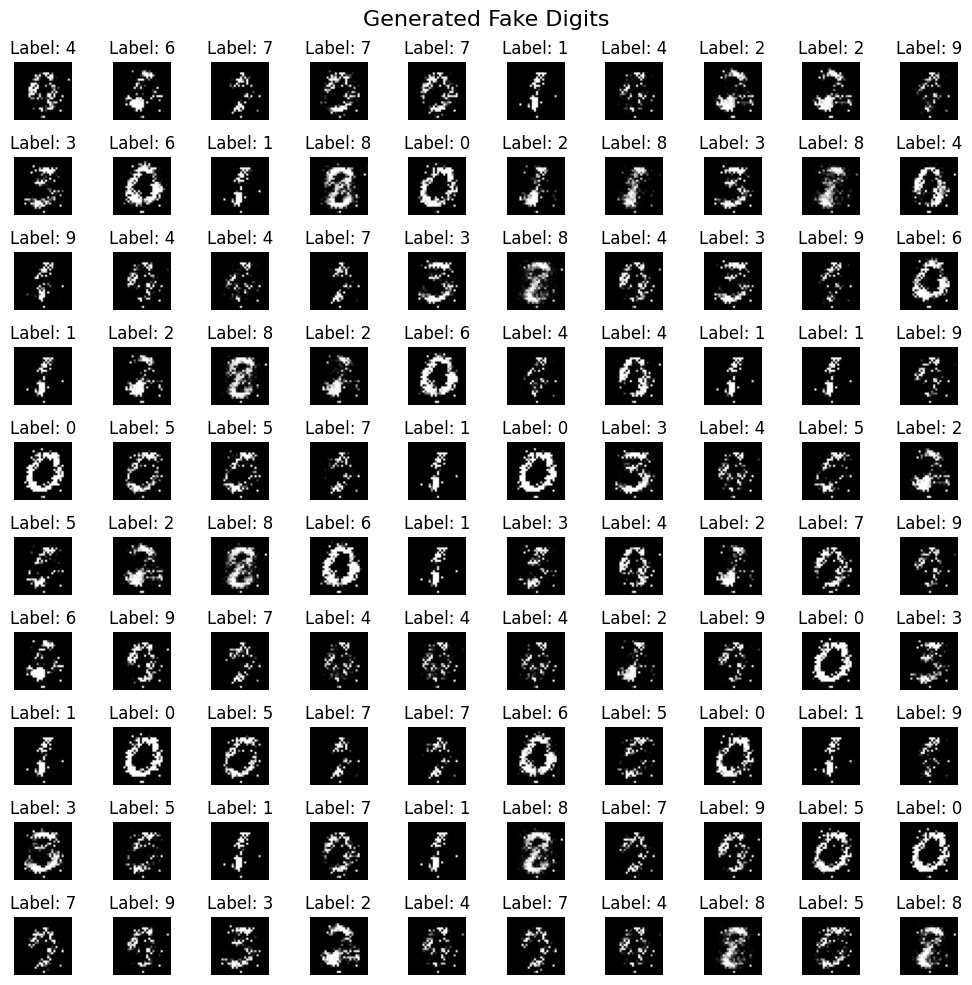

Epoch [3/50], Step [200/600], d_loss: 0.1737, g_loss: 3.8373, D(x): 0.93, D(G(z)): 0.04
Epoch [3/50], Step [400/600], d_loss: 0.2623, g_loss: 3.4689, D(x): 0.89, D(G(z)): 0.06
Epoch [3/50], Step [600/600], d_loss: 0.2193, g_loss: 3.7589, D(x): 0.94, D(G(z)): 0.06
Epoch [3/50], Average d_loss: 0.3258, Average g_loss: 3.3915


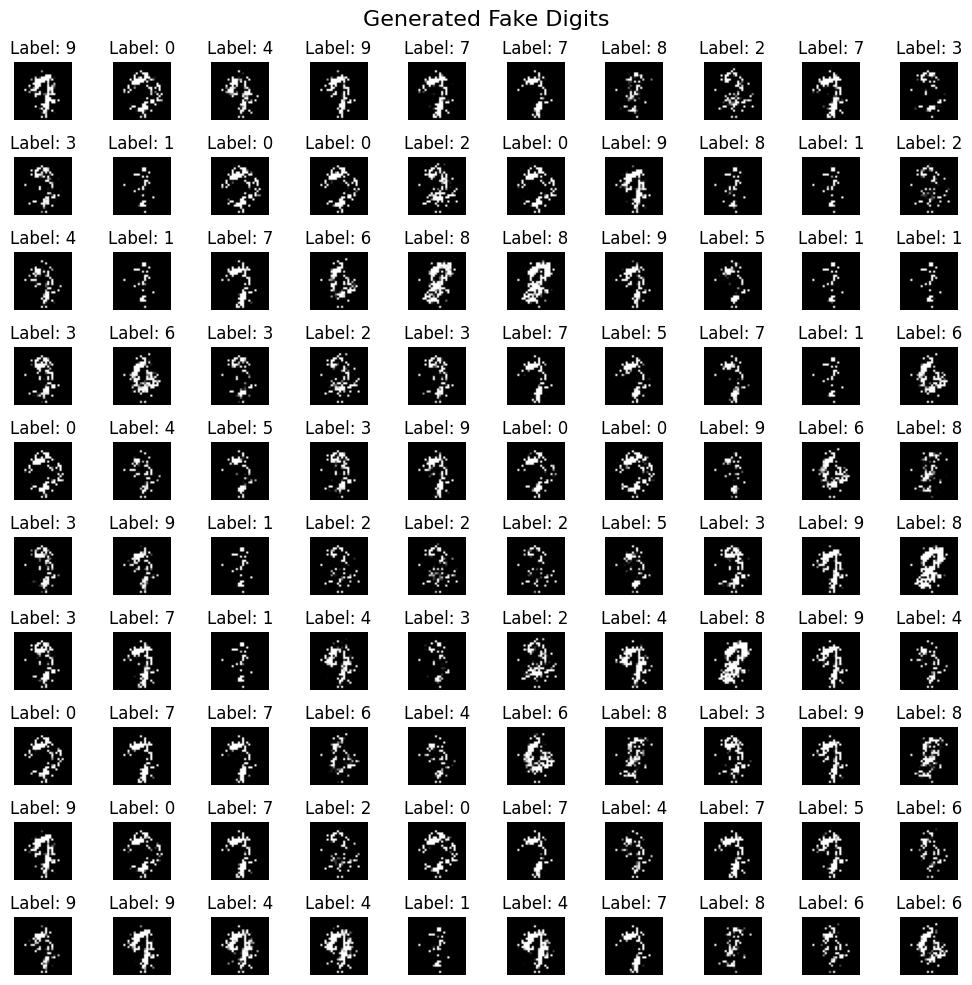

Epoch [4/50], Step [200/600], d_loss: 0.1301, g_loss: 3.9933, D(x): 0.98, D(G(z)): 0.08
Epoch [4/50], Step [400/600], d_loss: 0.3738, g_loss: 3.5272, D(x): 0.89, D(G(z)): 0.03
Epoch [4/50], Step [600/600], d_loss: 0.2102, g_loss: 3.3276, D(x): 0.93, D(G(z)): 0.07
Epoch [4/50], Average d_loss: 0.2805, Average g_loss: 3.8680


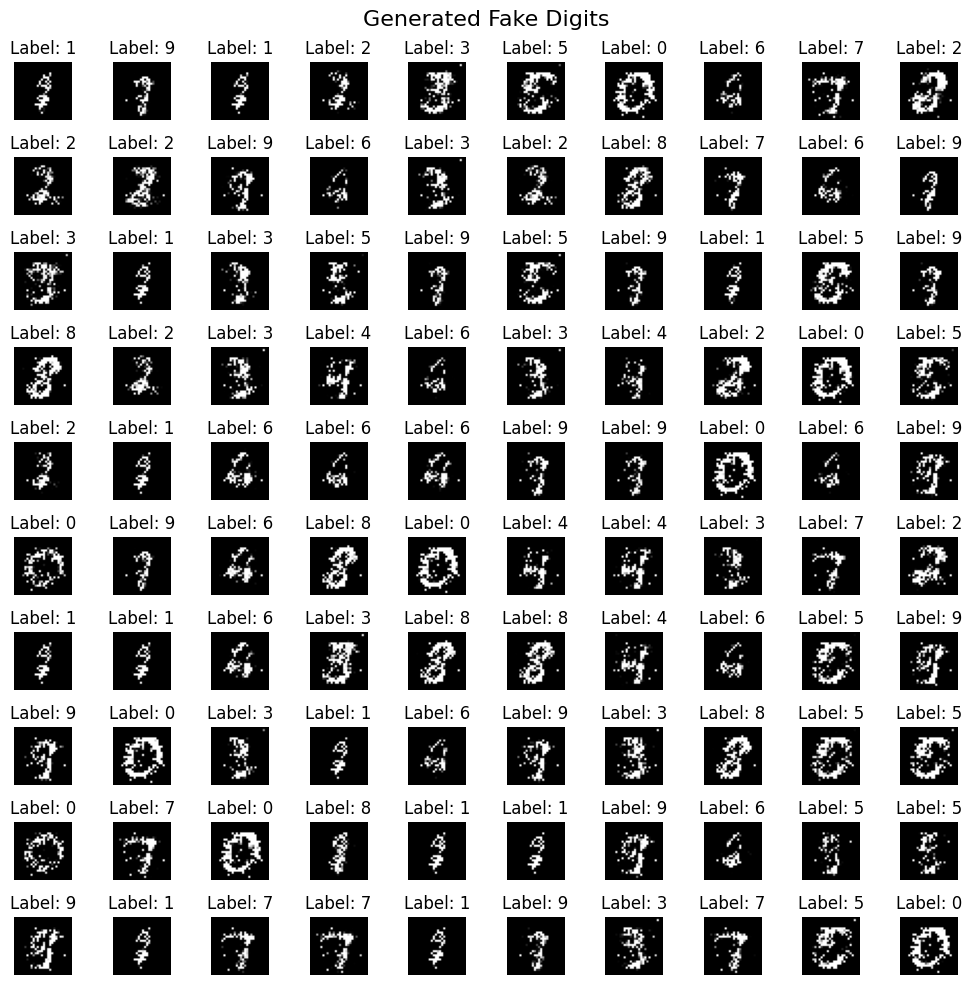

Epoch [5/50], Step [200/600], d_loss: 0.2171, g_loss: 4.4314, D(x): 0.91, D(G(z)): 0.03
Epoch [5/50], Step [400/600], d_loss: 0.2479, g_loss: 3.6246, D(x): 0.92, D(G(z)): 0.08
Epoch [5/50], Step [600/600], d_loss: 0.1803, g_loss: 3.9692, D(x): 0.92, D(G(z)): 0.02
Epoch [5/50], Average d_loss: 0.2477, Average g_loss: 4.0367


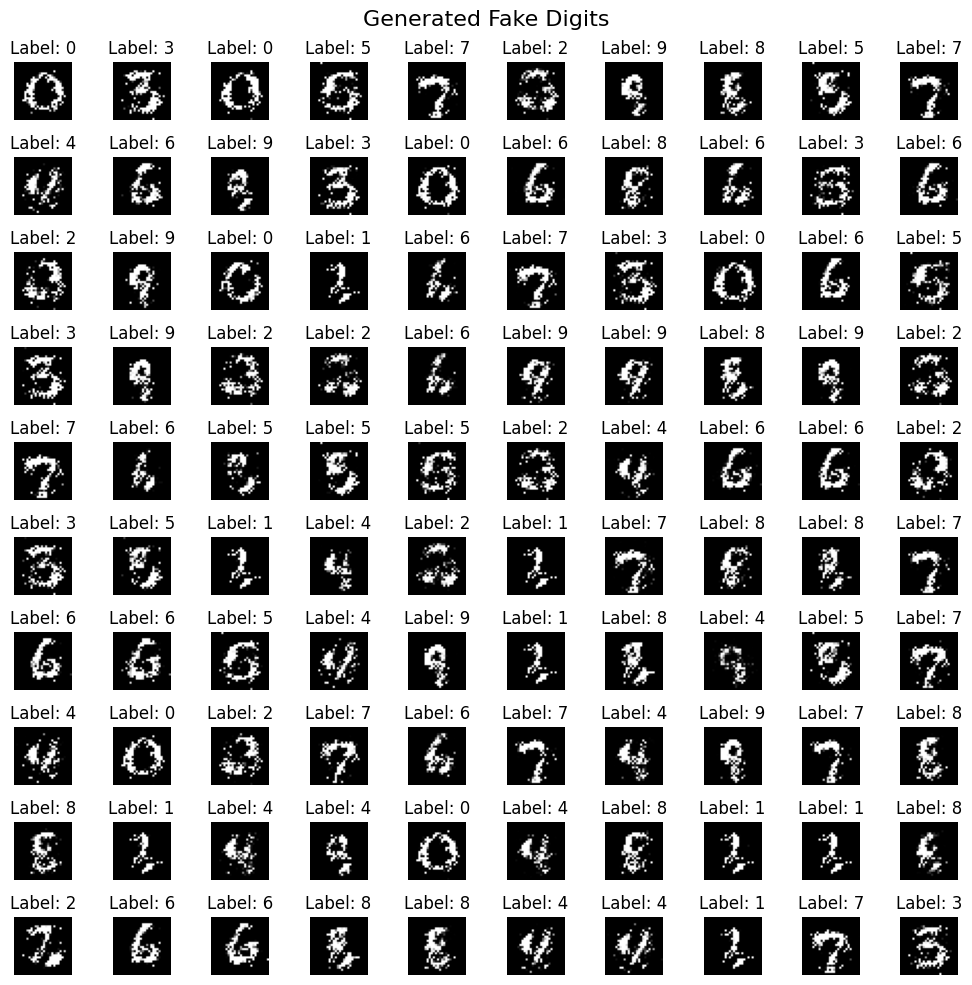

Epoch [6/50], Step [200/600], d_loss: 0.7176, g_loss: 4.2043, D(x): 0.75, D(G(z)): 0.01
Epoch [6/50], Step [400/600], d_loss: 0.1949, g_loss: 2.8046, D(x): 0.93, D(G(z)): 0.07
Epoch [6/50], Step [600/600], d_loss: 0.3073, g_loss: 3.1014, D(x): 0.90, D(G(z)): 0.07
Epoch [6/50], Average d_loss: 0.2799, Average g_loss: 3.9373


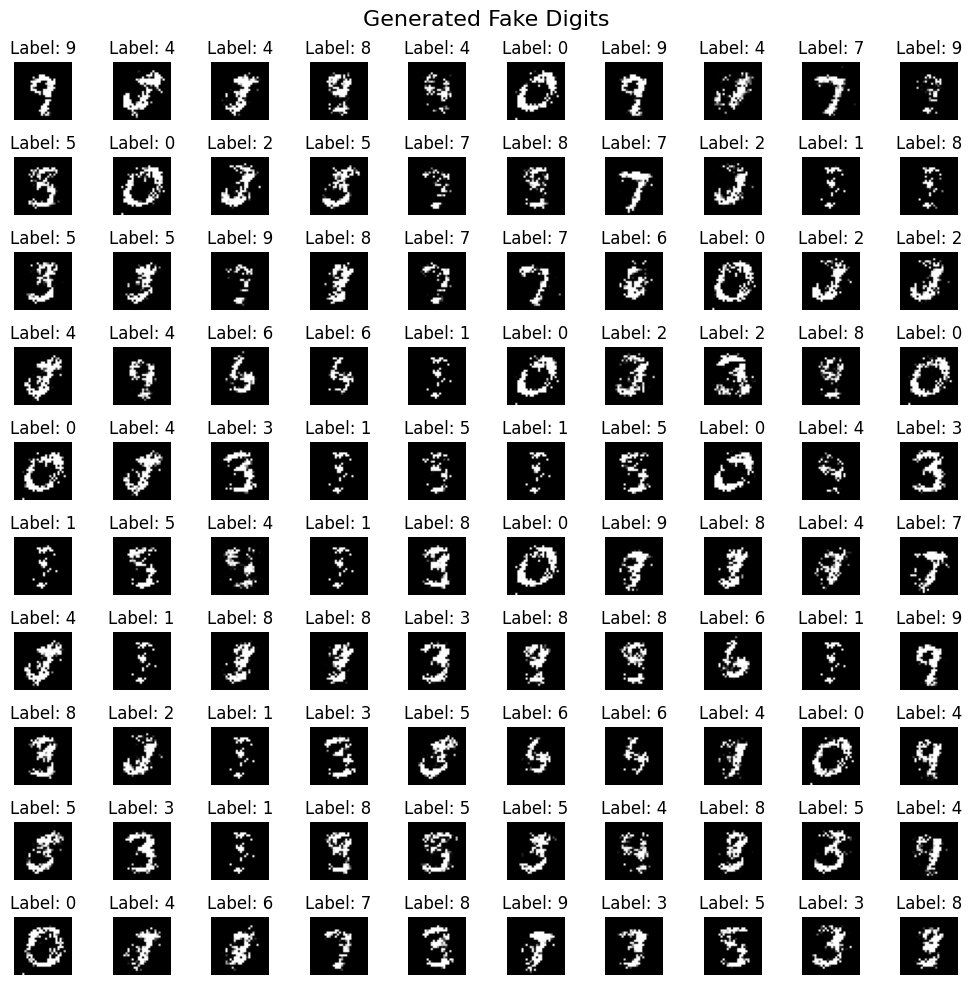

Epoch [7/50], Step [200/600], d_loss: 0.3486, g_loss: 4.3560, D(x): 0.95, D(G(z)): 0.18
Epoch [7/50], Step [400/600], d_loss: 0.3246, g_loss: 2.3876, D(x): 0.88, D(G(z)): 0.10
Epoch [7/50], Step [600/600], d_loss: 0.3604, g_loss: 2.3200, D(x): 0.88, D(G(z)): 0.12
Epoch [7/50], Average d_loss: 0.3758, Average g_loss: 3.3814


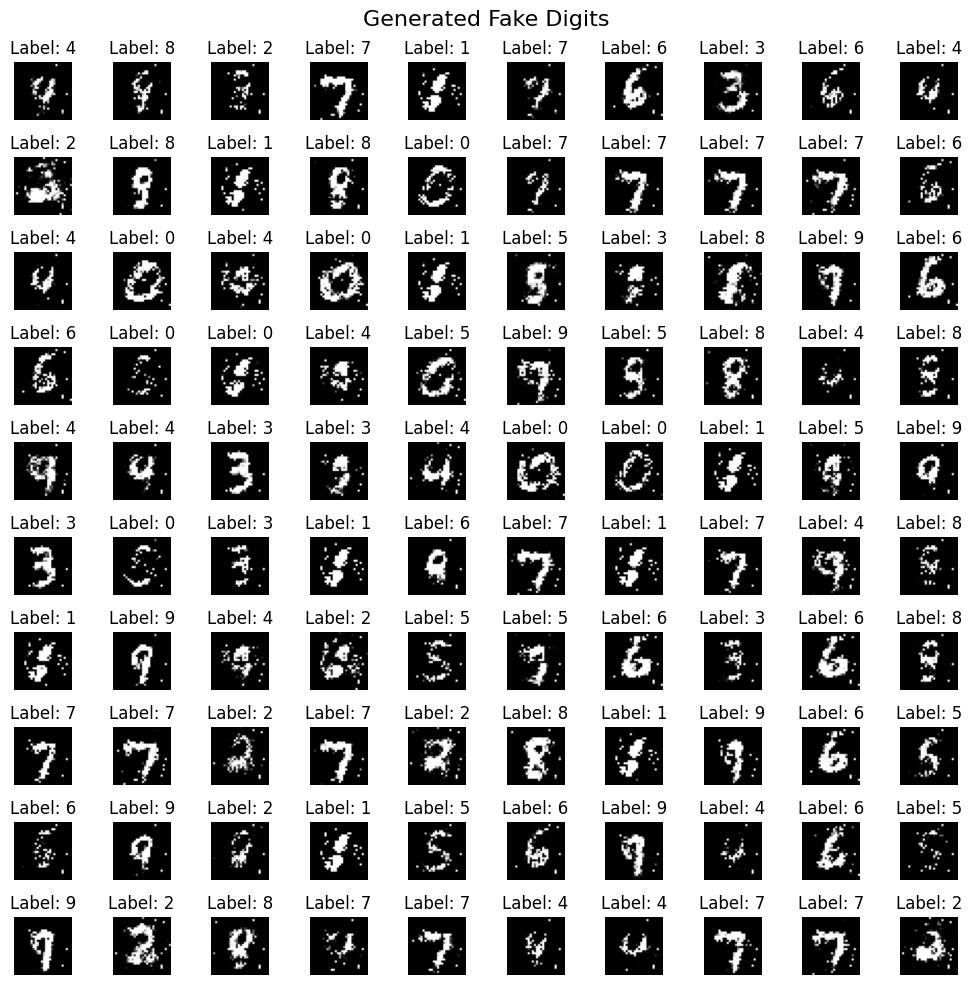

Epoch [8/50], Step [200/600], d_loss: 0.3851, g_loss: 3.4580, D(x): 0.92, D(G(z)): 0.18
Epoch [8/50], Step [400/600], d_loss: 0.5027, g_loss: 2.6074, D(x): 0.83, D(G(z)): 0.15
Epoch [8/50], Step [600/600], d_loss: 0.5471, g_loss: 2.9933, D(x): 0.85, D(G(z)): 0.17
Epoch [8/50], Average d_loss: 0.4324, Average g_loss: 3.0988


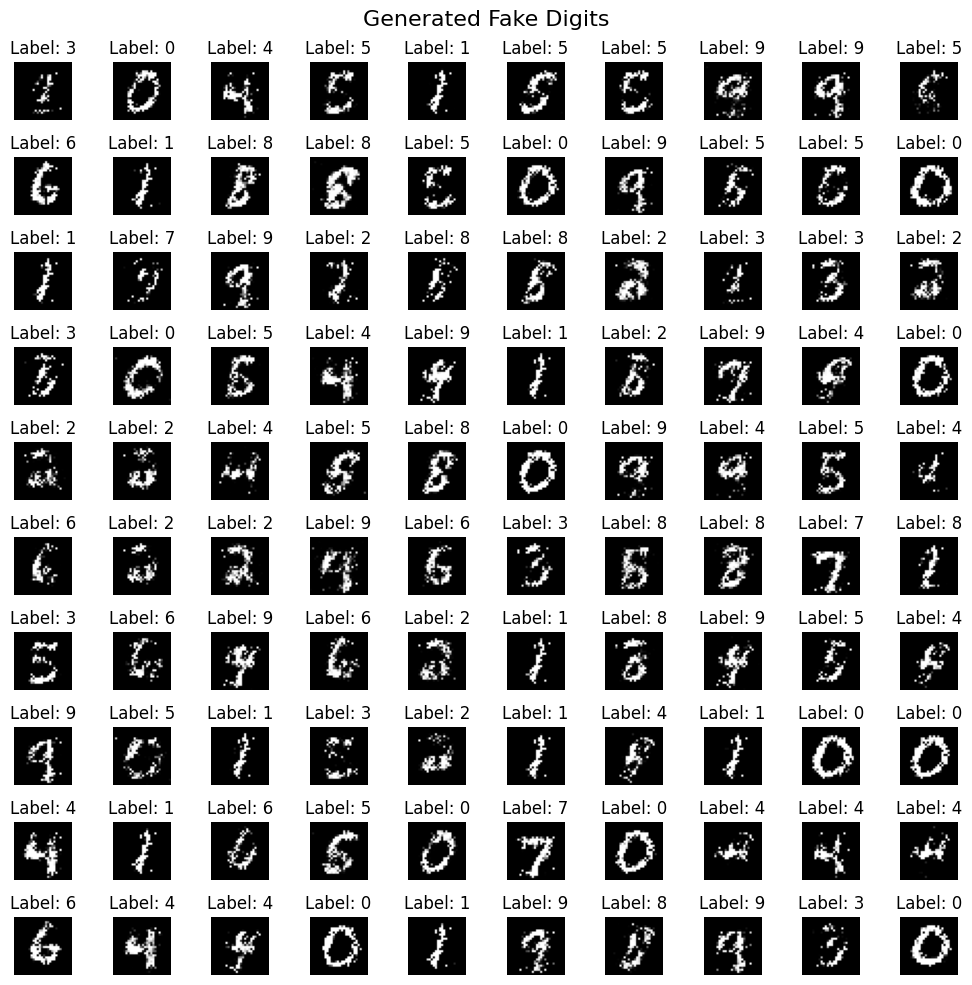

Epoch [9/50], Step [200/600], d_loss: 0.4463, g_loss: 2.6279, D(x): 0.82, D(G(z)): 0.10
Epoch [9/50], Step [400/600], d_loss: 0.5979, g_loss: 2.1627, D(x): 0.76, D(G(z)): 0.08
Epoch [9/50], Step [600/600], d_loss: 0.4484, g_loss: 2.4471, D(x): 0.83, D(G(z)): 0.14
Epoch [9/50], Average d_loss: 0.5281, Average g_loss: 2.6367


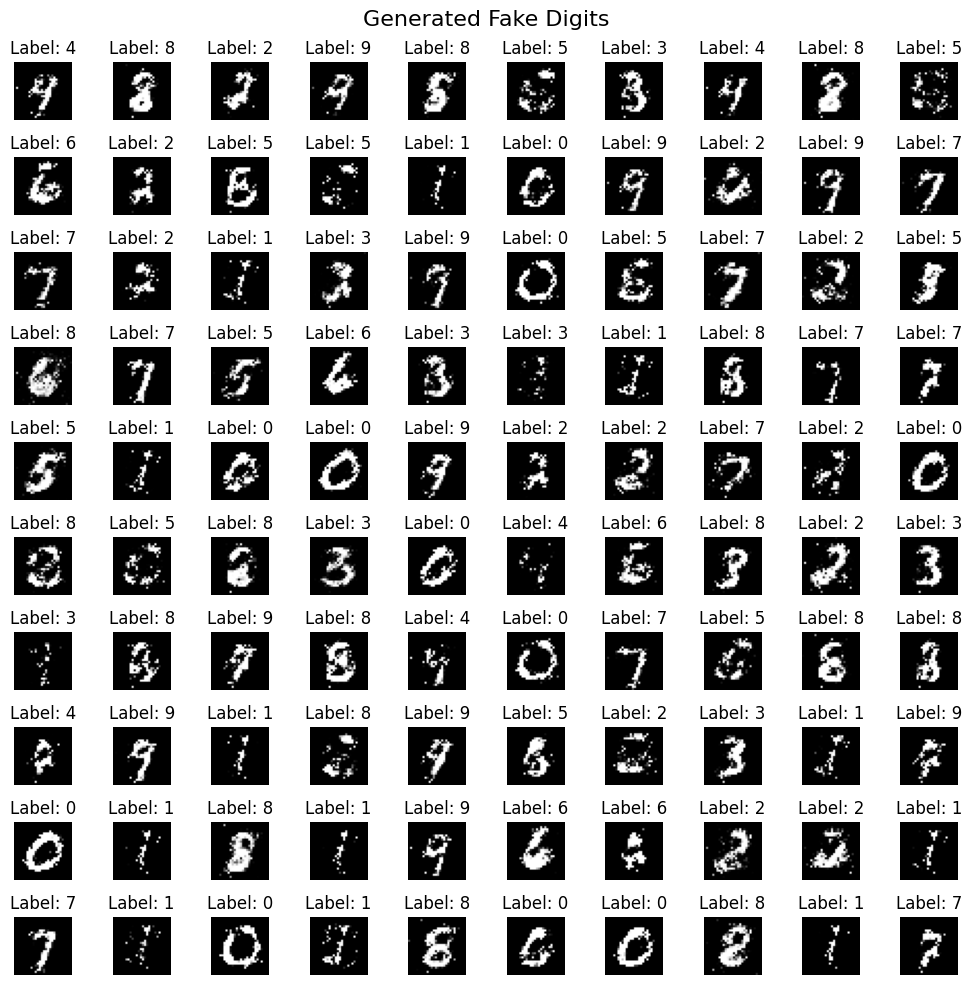

Epoch [10/50], Step [200/600], d_loss: 0.6614, g_loss: 3.0910, D(x): 0.87, D(G(z)): 0.27
Epoch [10/50], Step [400/600], d_loss: 0.6403, g_loss: 2.4134, D(x): 0.83, D(G(z)): 0.24
Epoch [10/50], Step [600/600], d_loss: 0.4685, g_loss: 2.2128, D(x): 0.83, D(G(z)): 0.13
Epoch [10/50], Average d_loss: 0.6020, Average g_loss: 2.3746


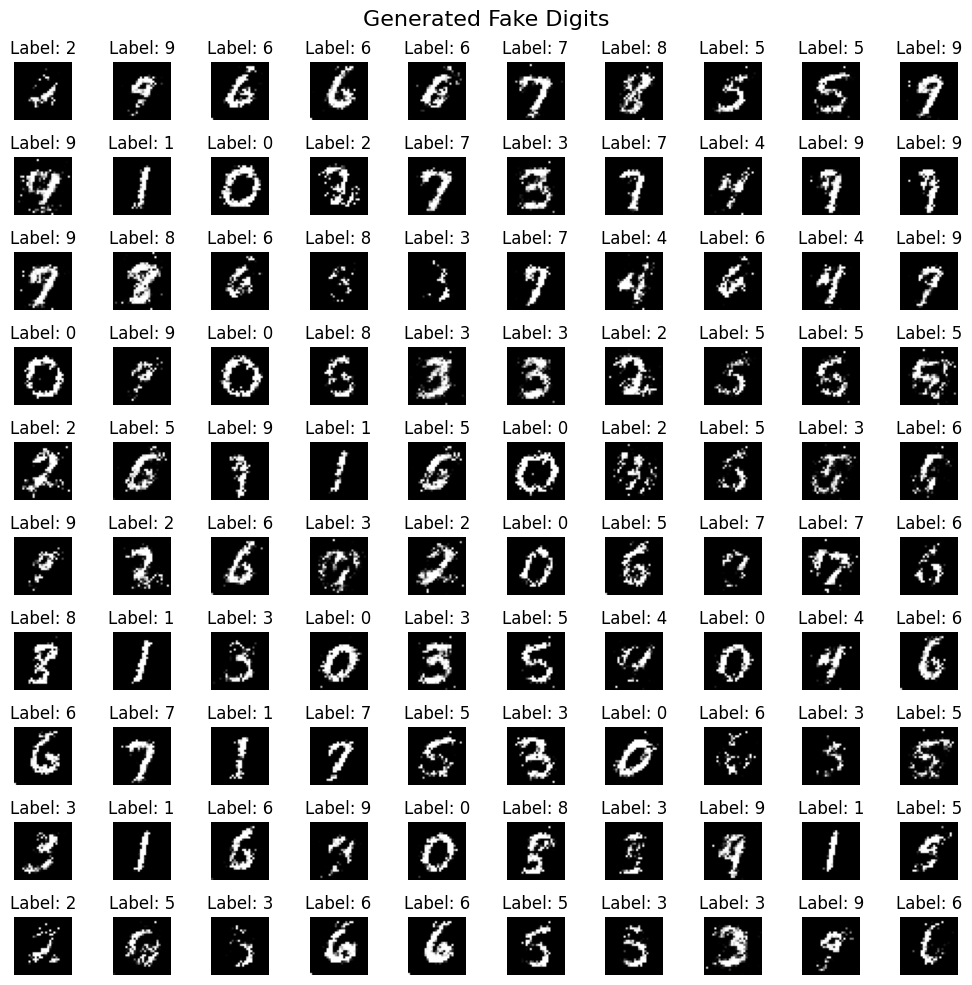

Epoch [11/50], Step [200/600], d_loss: 0.5698, g_loss: 2.2015, D(x): 0.79, D(G(z)): 0.18
Epoch [11/50], Step [400/600], d_loss: 0.6654, g_loss: 2.3121, D(x): 0.83, D(G(z)): 0.28
Epoch [11/50], Step [600/600], d_loss: 0.7422, g_loss: 1.9287, D(x): 0.72, D(G(z)): 0.17
Epoch [11/50], Average d_loss: 0.6938, Average g_loss: 2.0974


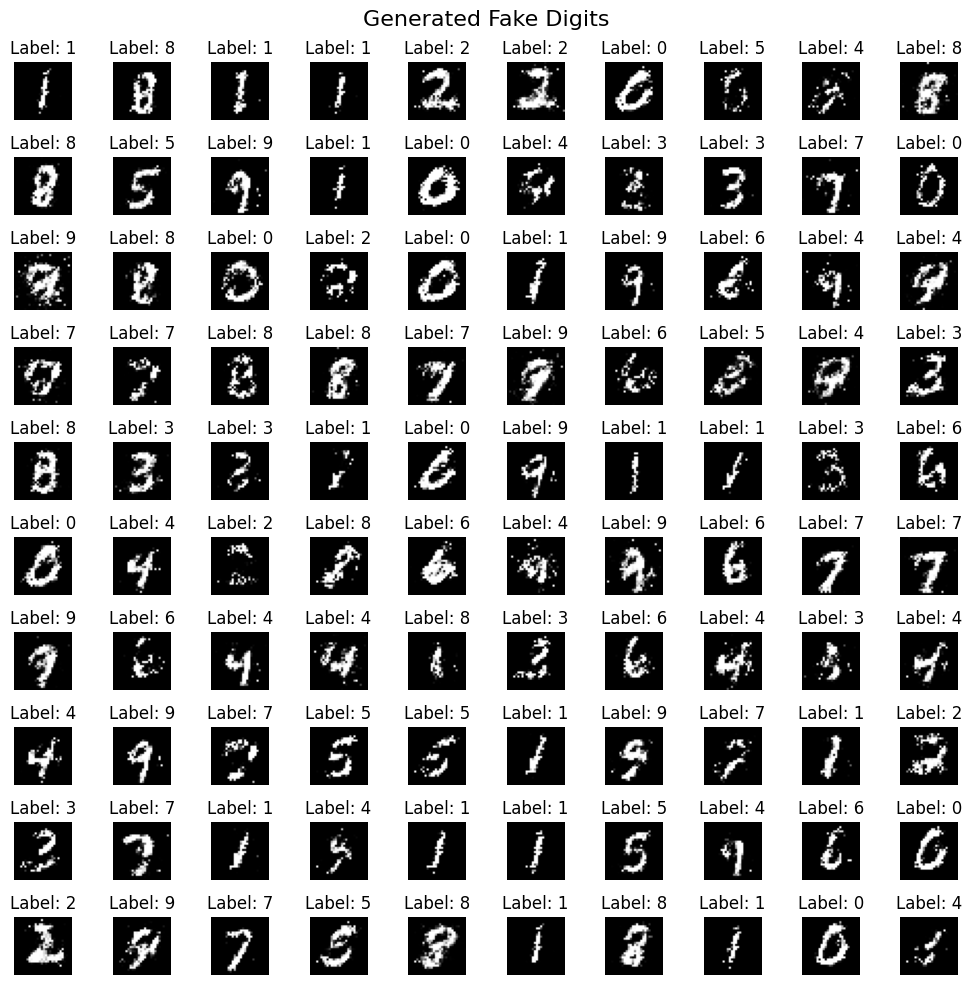

Epoch [12/50], Step [200/600], d_loss: 0.7575, g_loss: 2.0819, D(x): 0.86, D(G(z)): 0.37
Epoch [12/50], Step [400/600], d_loss: 0.7157, g_loss: 1.3683, D(x): 0.69, D(G(z)): 0.14
Epoch [12/50], Step [600/600], d_loss: 0.8056, g_loss: 1.9551, D(x): 0.80, D(G(z)): 0.32
Epoch [12/50], Average d_loss: 0.7711, Average g_loss: 1.9215


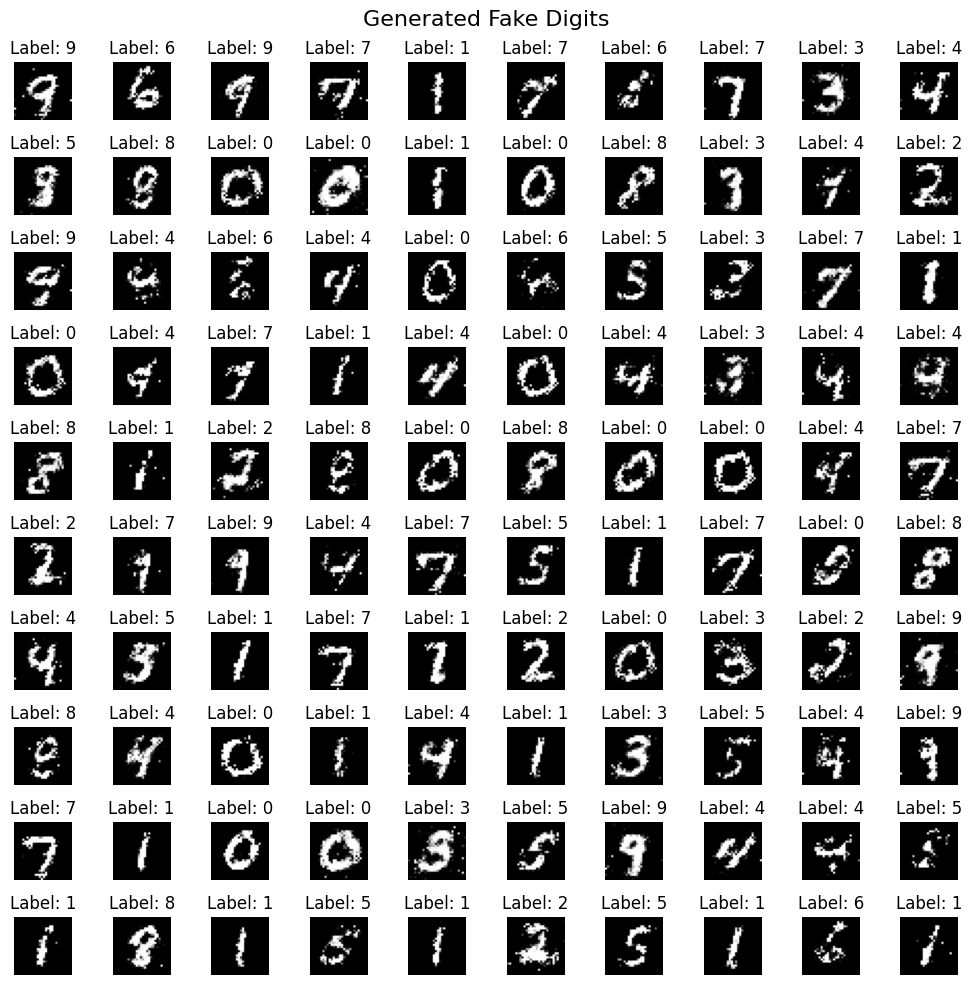

Epoch [13/50], Step [200/600], d_loss: 0.7520, g_loss: 1.7623, D(x): 0.76, D(G(z)): 0.25
Epoch [13/50], Step [400/600], d_loss: 0.6738, g_loss: 1.7830, D(x): 0.80, D(G(z)): 0.26
Epoch [13/50], Step [600/600], d_loss: 0.6707, g_loss: 1.8359, D(x): 0.76, D(G(z)): 0.21
Epoch [13/50], Average d_loss: 0.8183, Average g_loss: 1.8198


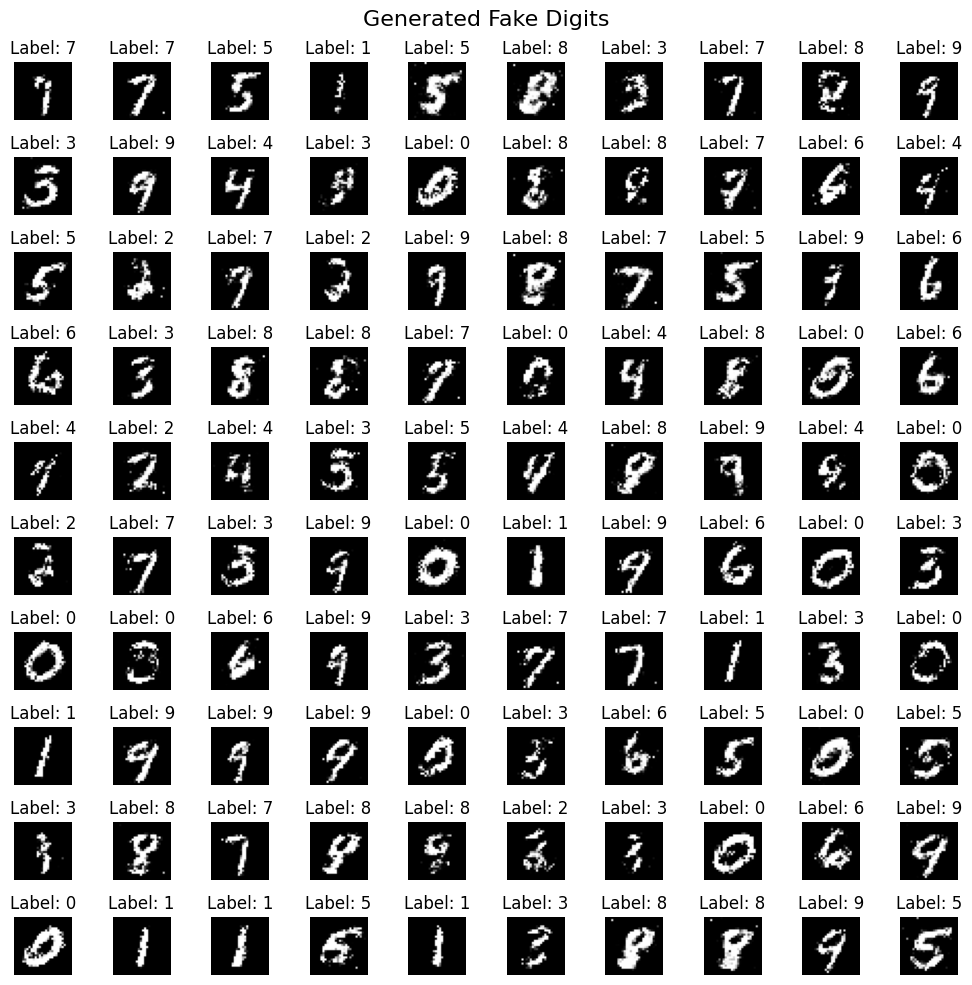

Epoch [14/50], Step [200/600], d_loss: 0.8219, g_loss: 1.5548, D(x): 0.68, D(G(z)): 0.23
Epoch [14/50], Step [400/600], d_loss: 0.9094, g_loss: 1.7683, D(x): 0.73, D(G(z)): 0.32
Epoch [14/50], Step [600/600], d_loss: 0.8426, g_loss: 1.4645, D(x): 0.74, D(G(z)): 0.32
Epoch [14/50], Average d_loss: 0.8667, Average g_loss: 1.7047


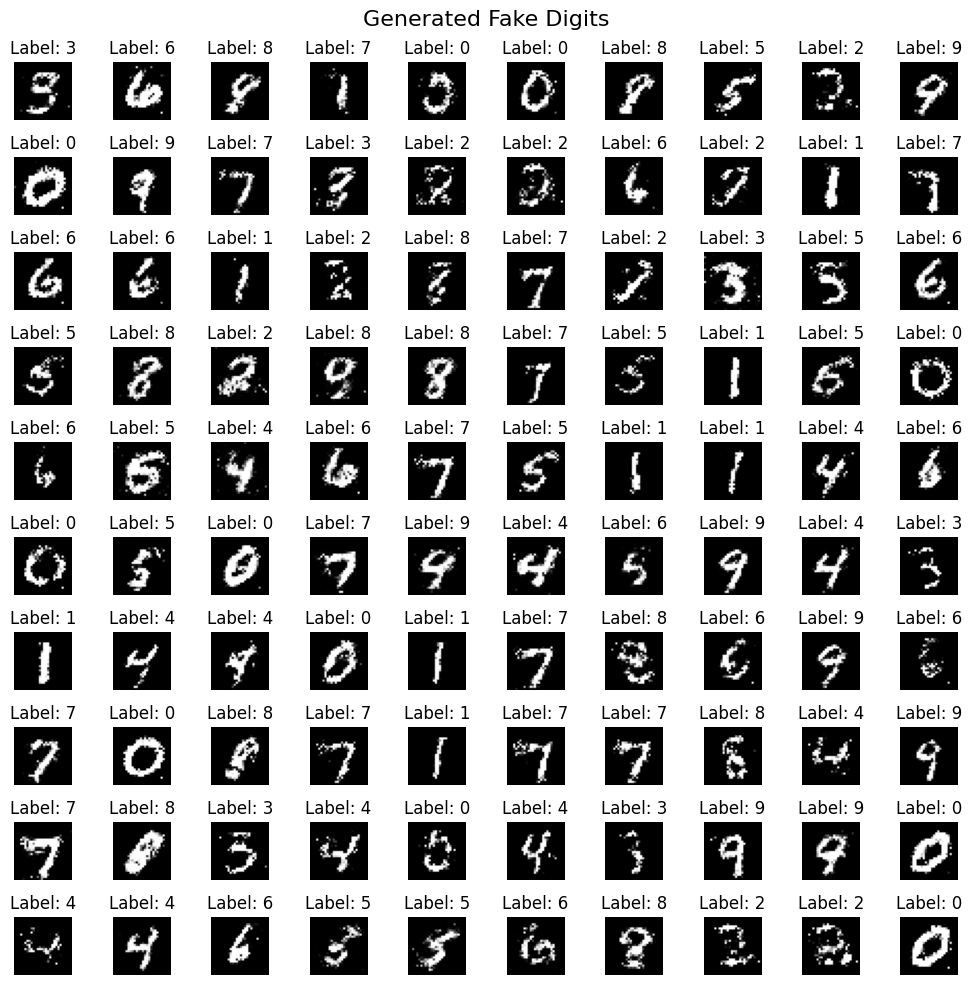

Epoch [15/50], Step [200/600], d_loss: 0.8116, g_loss: 1.5552, D(x): 0.73, D(G(z)): 0.28
Epoch [15/50], Step [400/600], d_loss: 0.8642, g_loss: 1.9826, D(x): 0.76, D(G(z)): 0.31
Epoch [15/50], Step [600/600], d_loss: 0.9756, g_loss: 1.5436, D(x): 0.65, D(G(z)): 0.27
Epoch [15/50], Average d_loss: 0.8939, Average g_loss: 1.6386


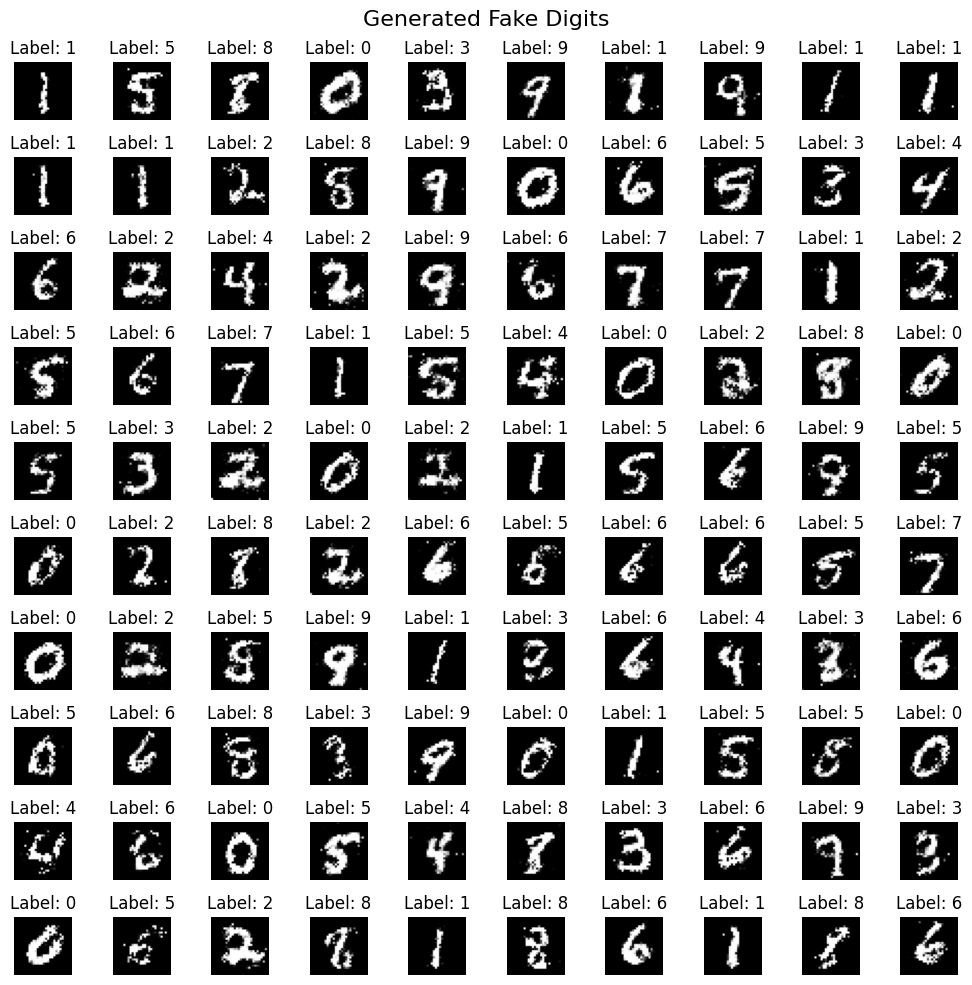

Epoch [16/50], Step [200/600], d_loss: 0.9227, g_loss: 1.2684, D(x): 0.63, D(G(z)): 0.25
Epoch [16/50], Step [400/600], d_loss: 0.8632, g_loss: 1.3478, D(x): 0.71, D(G(z)): 0.30
Epoch [16/50], Step [600/600], d_loss: 0.9102, g_loss: 1.5758, D(x): 0.73, D(G(z)): 0.34
Epoch [16/50], Average d_loss: 0.9349, Average g_loss: 1.5478


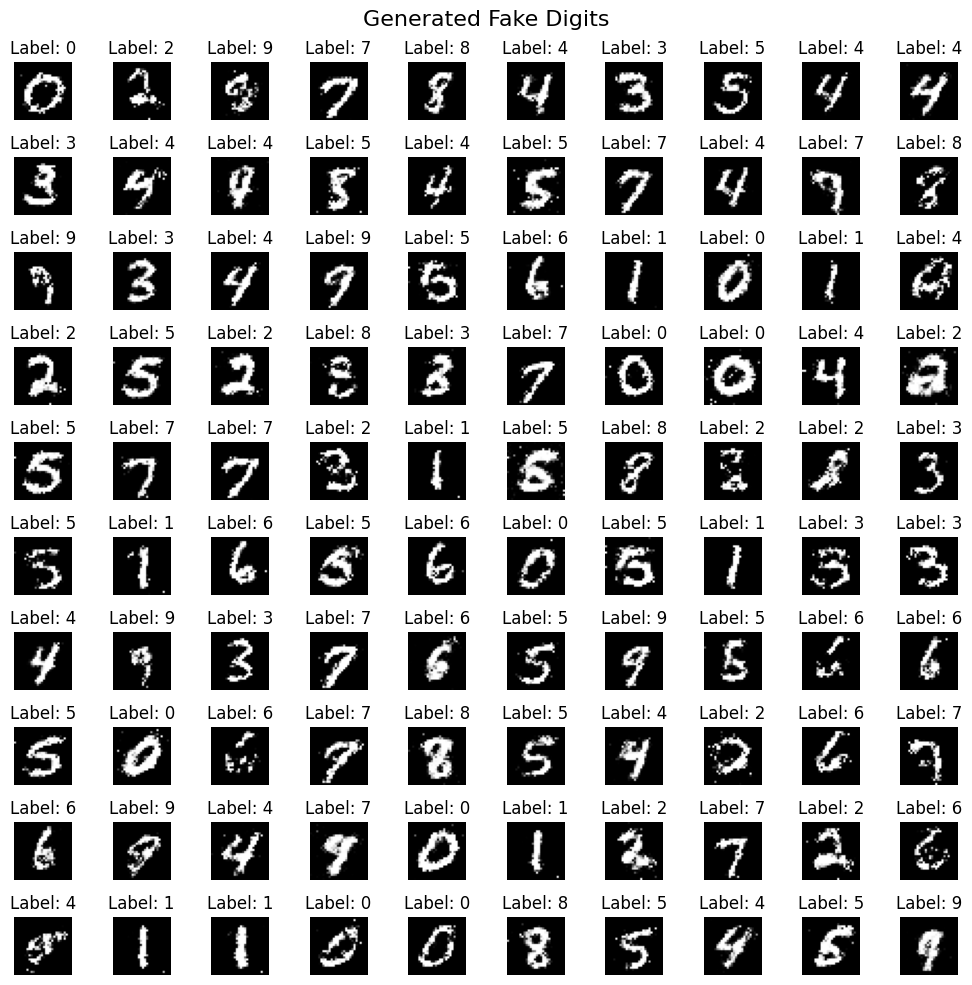

Epoch [17/50], Step [200/600], d_loss: 0.9256, g_loss: 1.6348, D(x): 0.69, D(G(z)): 0.33
Epoch [17/50], Step [400/600], d_loss: 0.9742, g_loss: 1.3449, D(x): 0.71, D(G(z)): 0.35
Epoch [17/50], Step [600/600], d_loss: 0.7753, g_loss: 1.5776, D(x): 0.78, D(G(z)): 0.33
Epoch [17/50], Average d_loss: 0.9716, Average g_loss: 1.4780


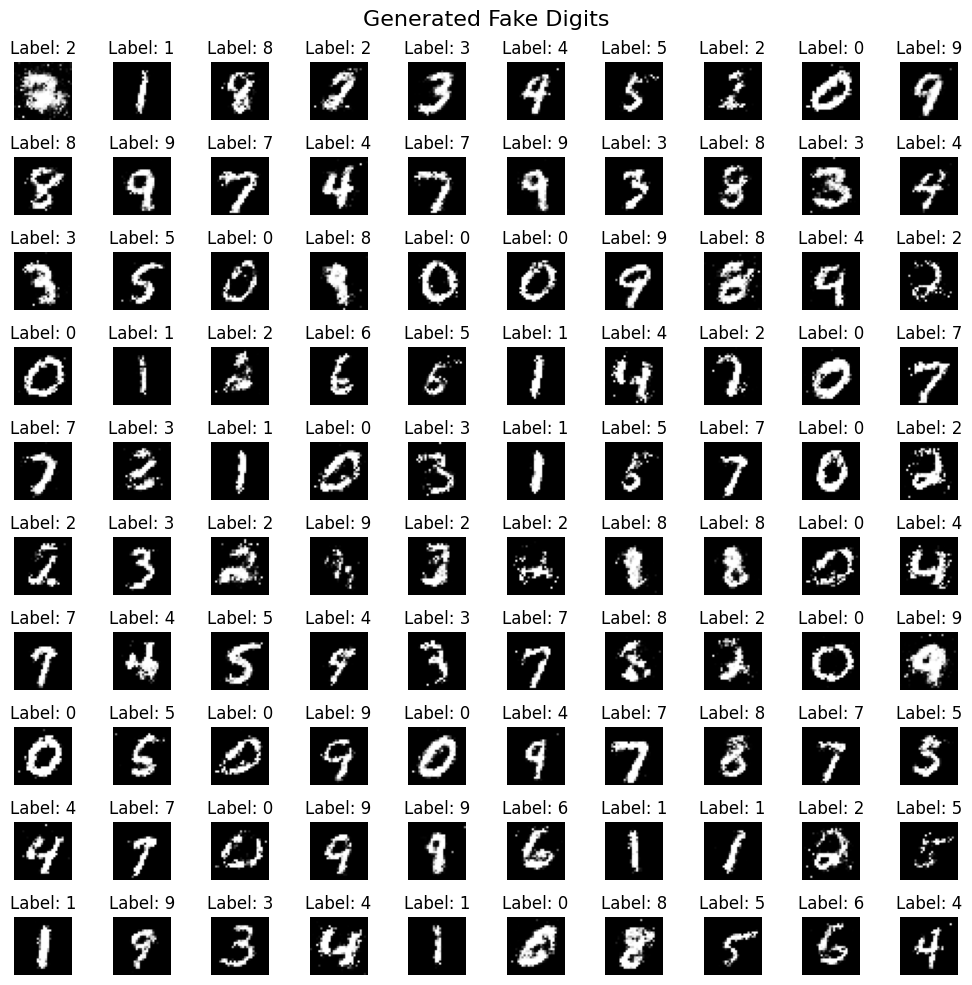

Epoch [18/50], Step [200/600], d_loss: 0.9004, g_loss: 1.4008, D(x): 0.68, D(G(z)): 0.29
Epoch [18/50], Step [400/600], d_loss: 1.0434, g_loss: 1.1802, D(x): 0.60, D(G(z)): 0.30
Epoch [18/50], Step [600/600], d_loss: 1.0006, g_loss: 1.3172, D(x): 0.69, D(G(z)): 0.36
Epoch [18/50], Average d_loss: 0.9914, Average g_loss: 1.4540


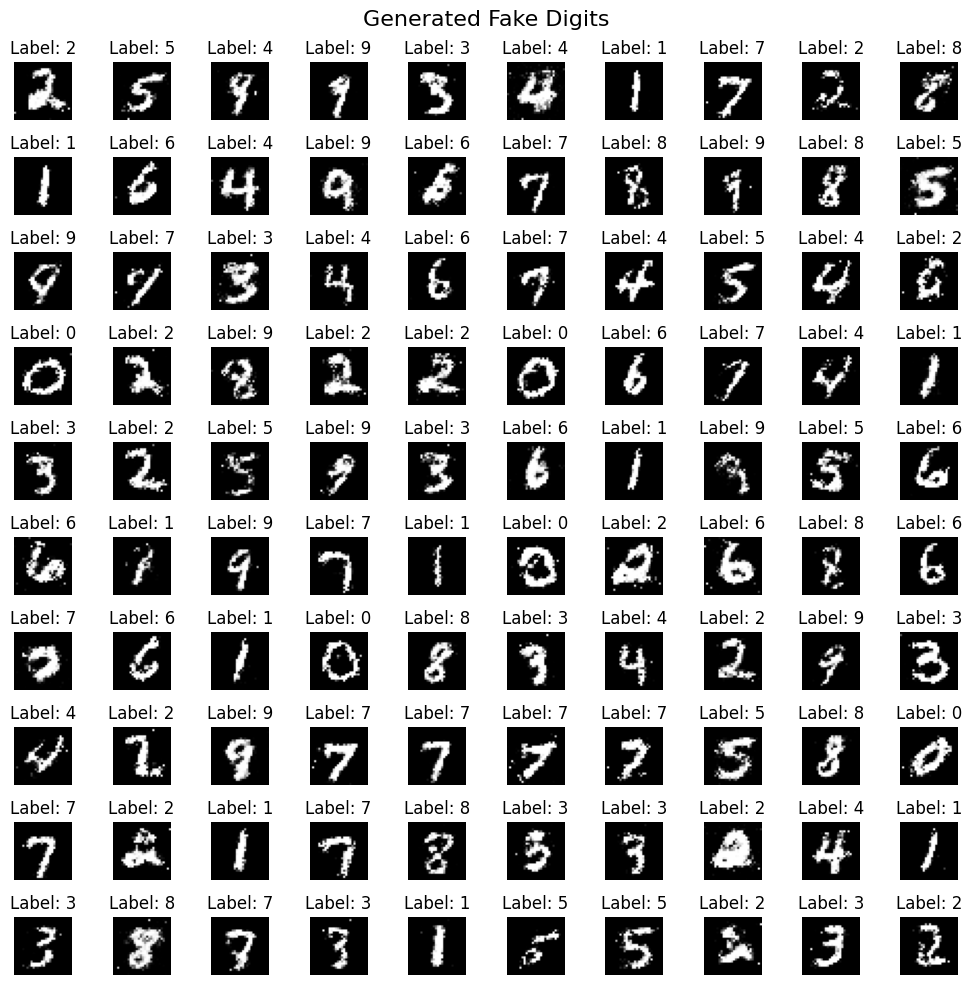

Epoch [19/50], Step [200/600], d_loss: 1.0359, g_loss: 1.4743, D(x): 0.63, D(G(z)): 0.31
Epoch [19/50], Step [400/600], d_loss: 0.9616, g_loss: 1.4231, D(x): 0.69, D(G(z)): 0.35
Epoch [19/50], Step [600/600], d_loss: 1.0341, g_loss: 1.4344, D(x): 0.65, D(G(z)): 0.36
Epoch [19/50], Average d_loss: 1.0155, Average g_loss: 1.3911


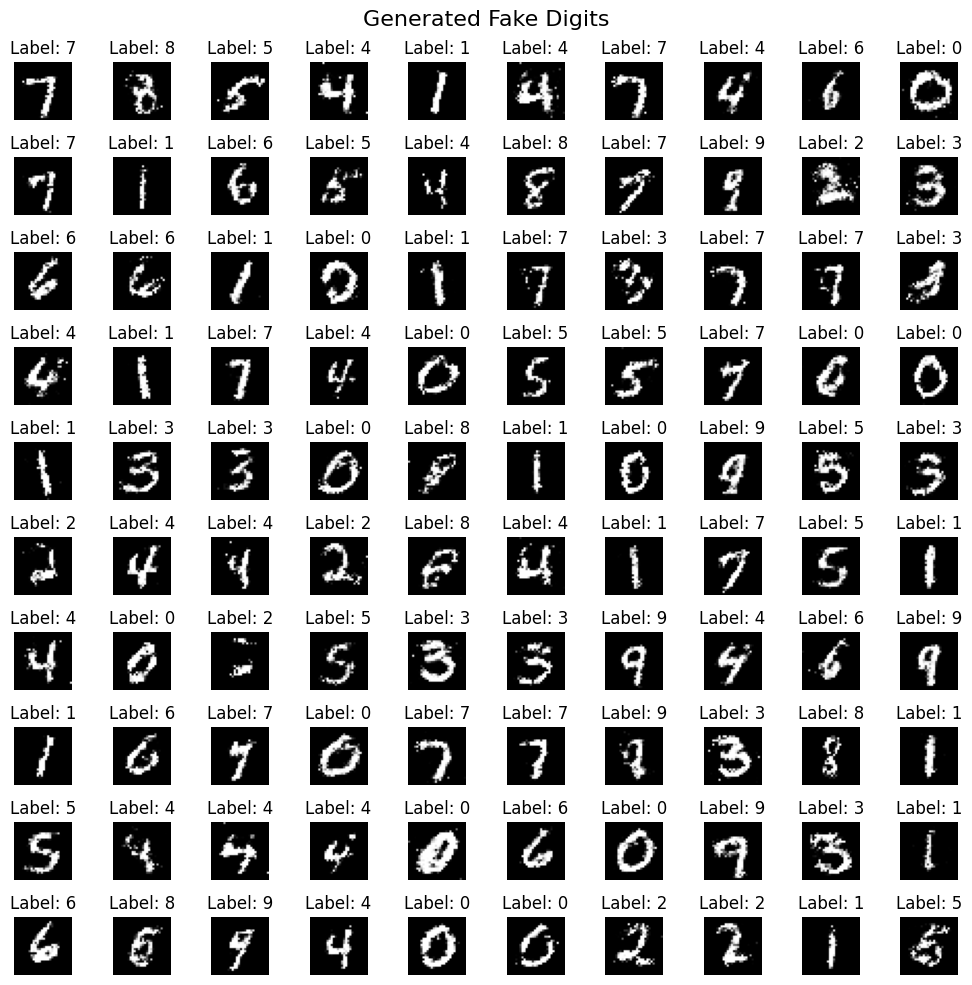

Epoch [20/50], Step [200/600], d_loss: 0.9901, g_loss: 1.5214, D(x): 0.60, D(G(z)): 0.25
Epoch [20/50], Step [400/600], d_loss: 0.9907, g_loss: 1.4476, D(x): 0.63, D(G(z)): 0.27
Epoch [20/50], Step [600/600], d_loss: 1.0980, g_loss: 1.3038, D(x): 0.63, D(G(z)): 0.35
Epoch [20/50], Average d_loss: 1.0341, Average g_loss: 1.3486


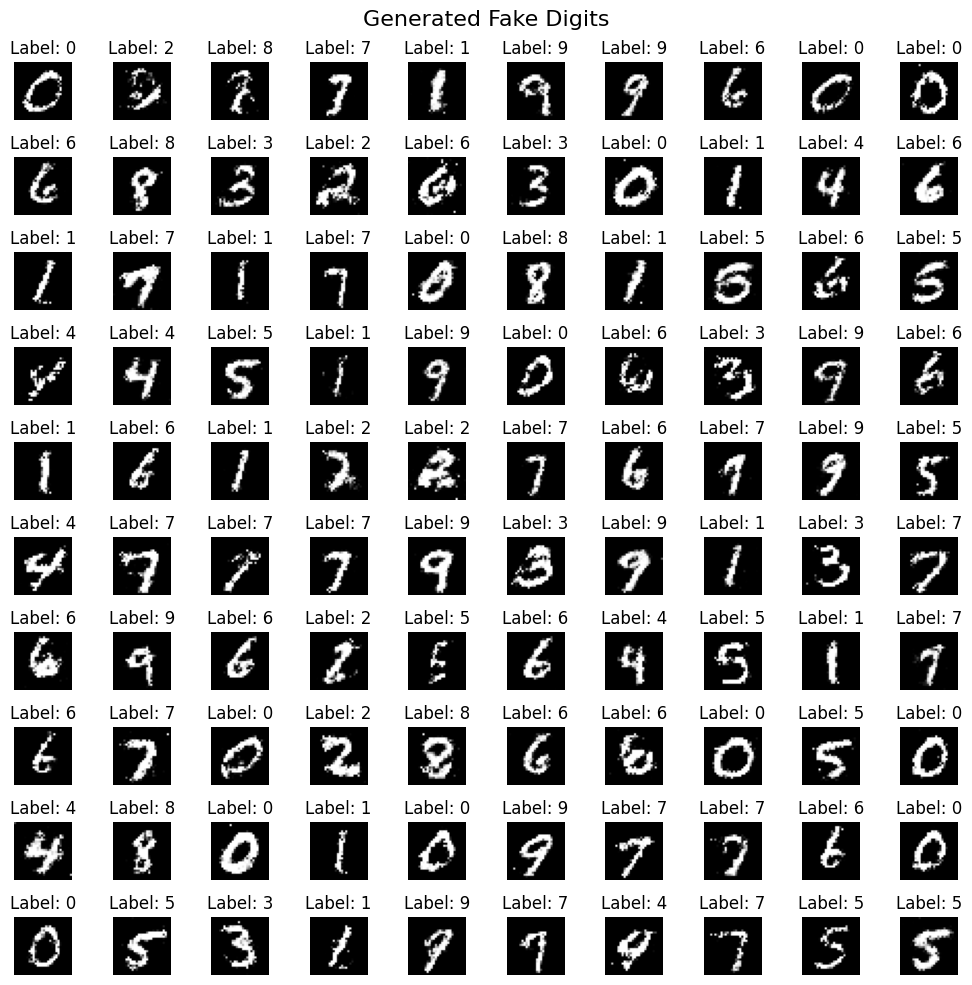

Epoch [21/50], Step [200/600], d_loss: 1.2025, g_loss: 1.1197, D(x): 0.56, D(G(z)): 0.35
Epoch [21/50], Step [400/600], d_loss: 1.0809, g_loss: 1.2688, D(x): 0.58, D(G(z)): 0.31
Epoch [21/50], Step [600/600], d_loss: 1.0710, g_loss: 1.1410, D(x): 0.61, D(G(z)): 0.33
Epoch [21/50], Average d_loss: 1.0455, Average g_loss: 1.3265


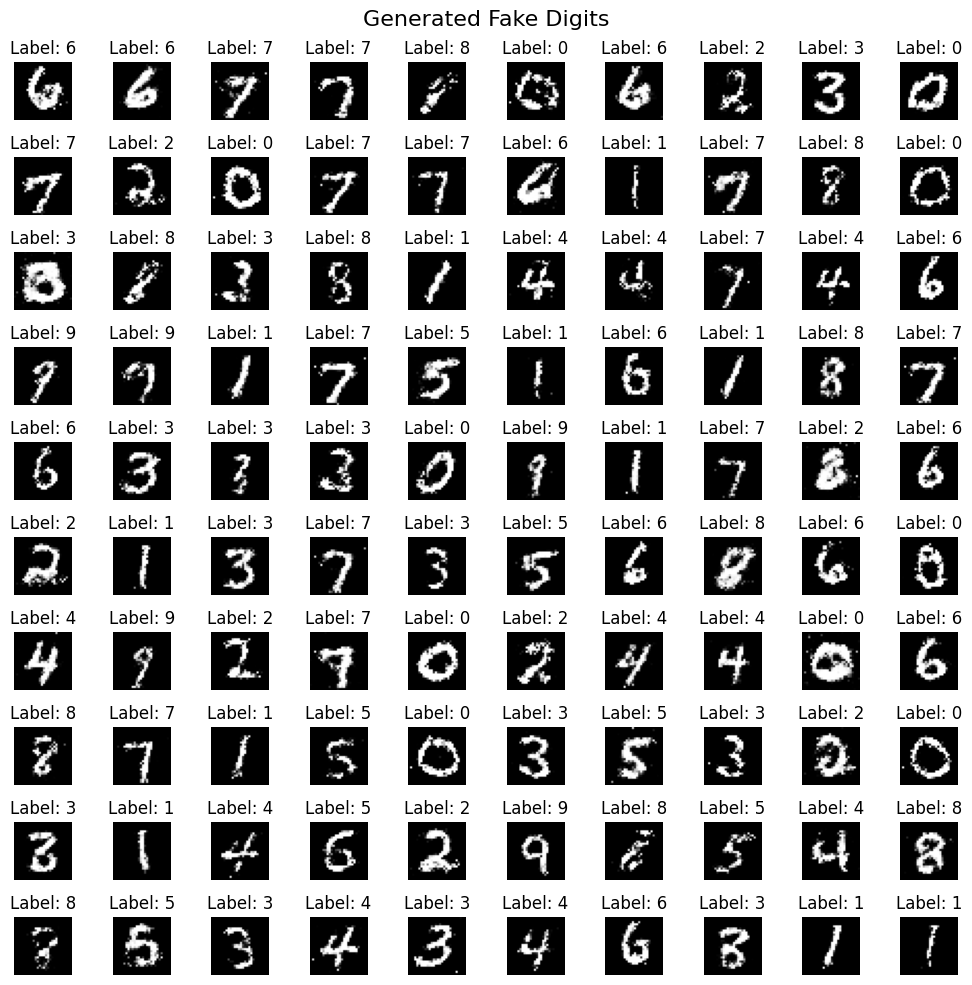

Epoch [22/50], Step [200/600], d_loss: 1.0707, g_loss: 1.2664, D(x): 0.68, D(G(z)): 0.41
Epoch [22/50], Step [400/600], d_loss: 1.0149, g_loss: 1.3879, D(x): 0.69, D(G(z)): 0.40
Epoch [22/50], Step [600/600], d_loss: 1.0304, g_loss: 1.4822, D(x): 0.69, D(G(z)): 0.38
Epoch [22/50], Average d_loss: 1.0594, Average g_loss: 1.2963


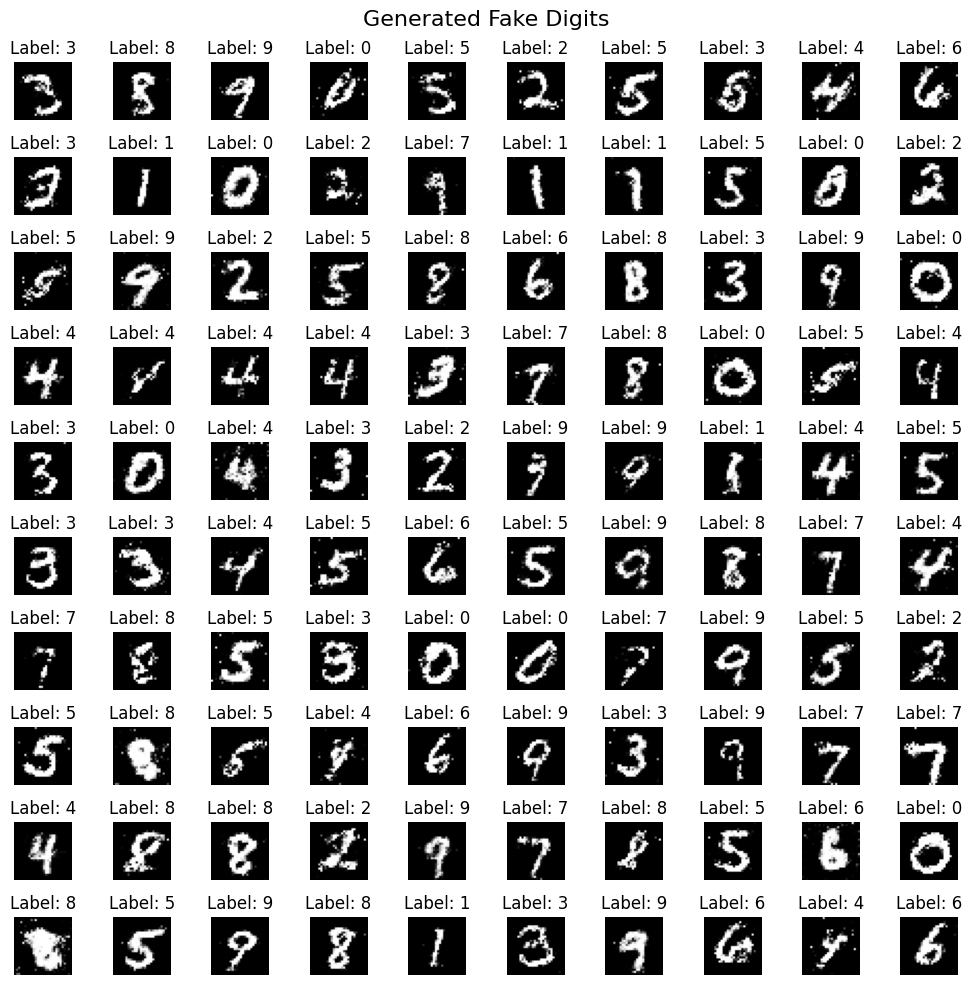

Epoch [23/50], Step [200/600], d_loss: 1.1252, g_loss: 1.0992, D(x): 0.61, D(G(z)): 0.37
Epoch [23/50], Step [400/600], d_loss: 1.0490, g_loss: 1.1987, D(x): 0.61, D(G(z)): 0.33
Epoch [23/50], Step [600/600], d_loss: 1.0668, g_loss: 1.2781, D(x): 0.67, D(G(z)): 0.38
Epoch [23/50], Average d_loss: 1.0685, Average g_loss: 1.2805


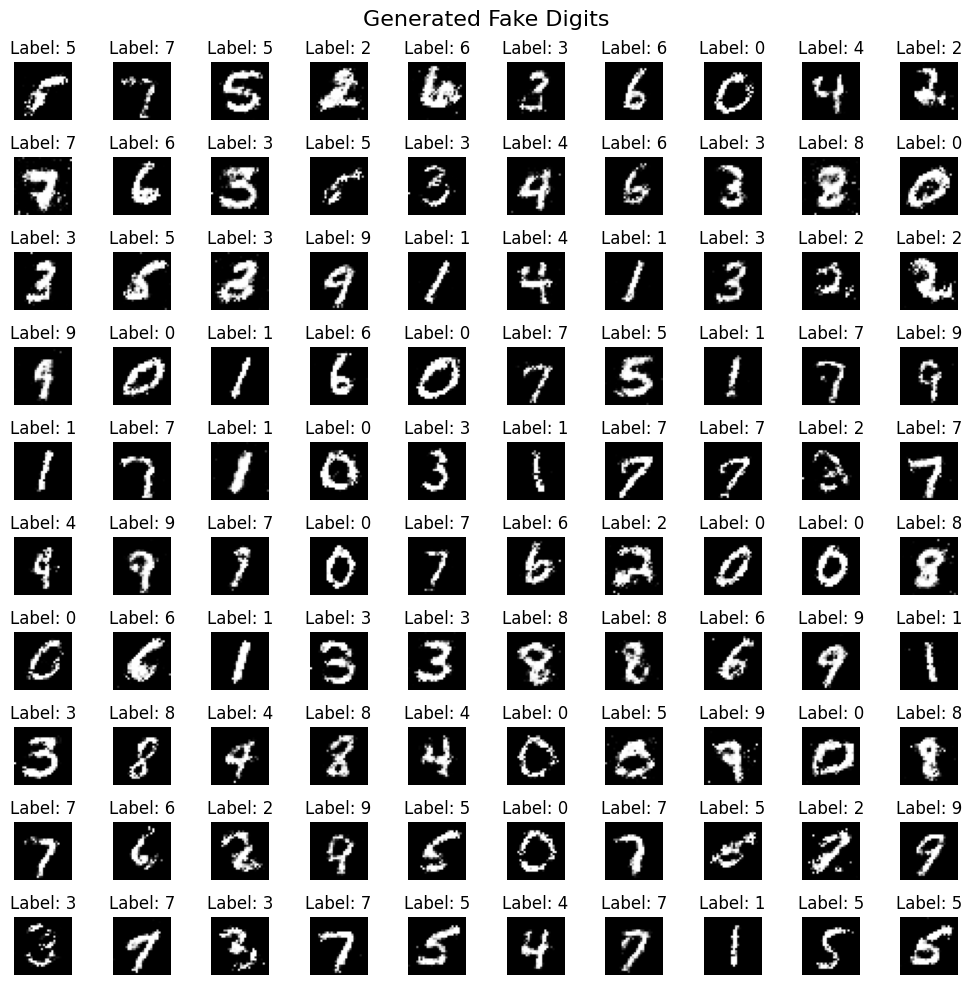

Epoch [24/50], Step [200/600], d_loss: 1.0135, g_loss: 1.2703, D(x): 0.62, D(G(z)): 0.33
Epoch [24/50], Step [400/600], d_loss: 1.0069, g_loss: 1.1933, D(x): 0.66, D(G(z)): 0.36
Epoch [24/50], Step [600/600], d_loss: 1.0820, g_loss: 1.2280, D(x): 0.64, D(G(z)): 0.39
Epoch [24/50], Average d_loss: 1.0820, Average g_loss: 1.2427


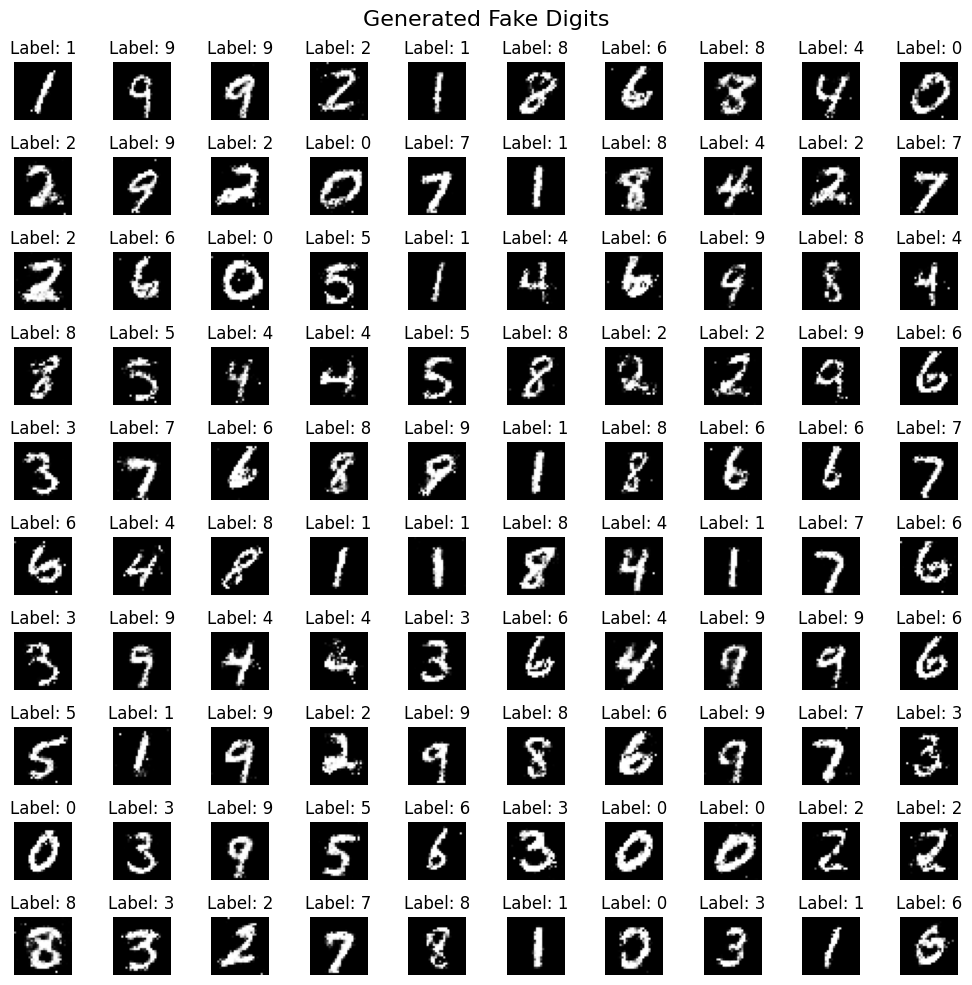

Epoch [25/50], Step [200/600], d_loss: 1.0573, g_loss: 1.2627, D(x): 0.70, D(G(z)): 0.41
Epoch [25/50], Step [400/600], d_loss: 1.0795, g_loss: 1.2950, D(x): 0.66, D(G(z)): 0.40
Epoch [25/50], Step [600/600], d_loss: 1.1407, g_loss: 1.2148, D(x): 0.57, D(G(z)): 0.33
Epoch [25/50], Average d_loss: 1.0911, Average g_loss: 1.2351


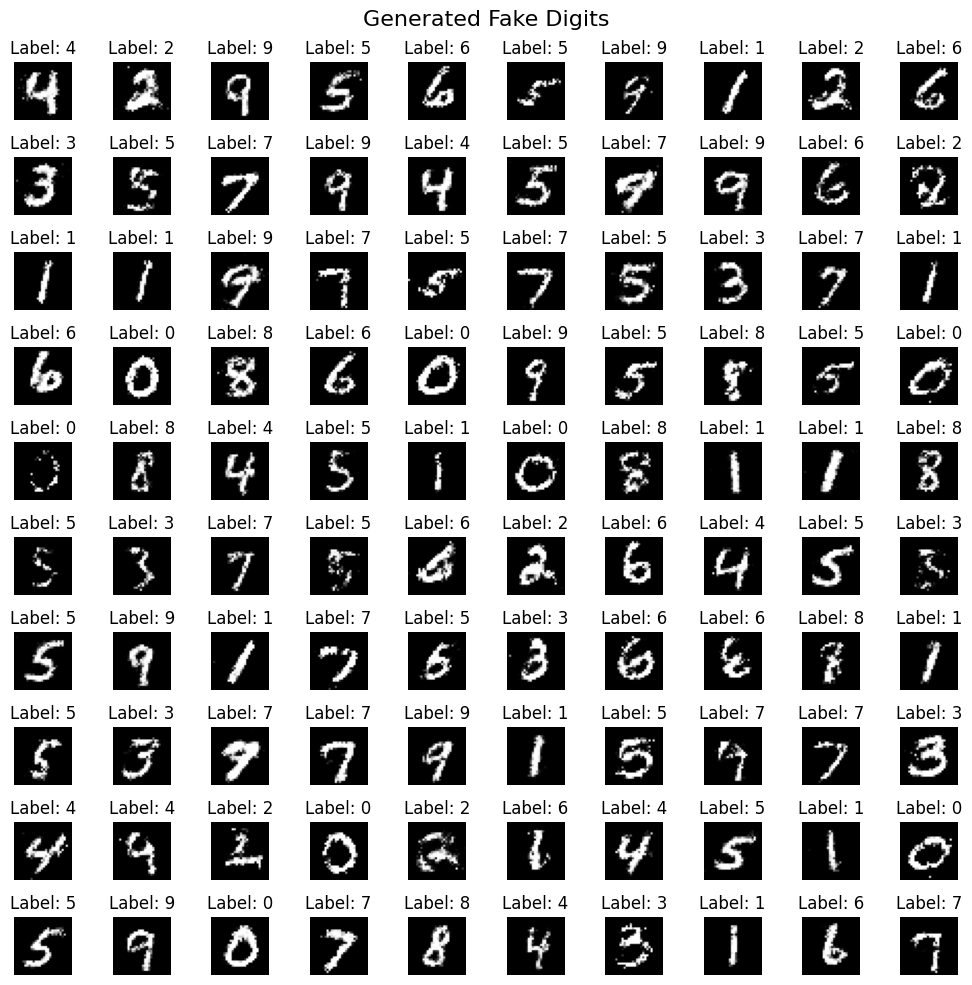

Epoch [26/50], Step [200/600], d_loss: 1.1632, g_loss: 1.2990, D(x): 0.64, D(G(z)): 0.42
Epoch [26/50], Step [400/600], d_loss: 1.1156, g_loss: 1.1415, D(x): 0.59, D(G(z)): 0.34
Epoch [26/50], Step [600/600], d_loss: 1.0845, g_loss: 1.3169, D(x): 0.69, D(G(z)): 0.41
Epoch [26/50], Average d_loss: 1.0949, Average g_loss: 1.2301


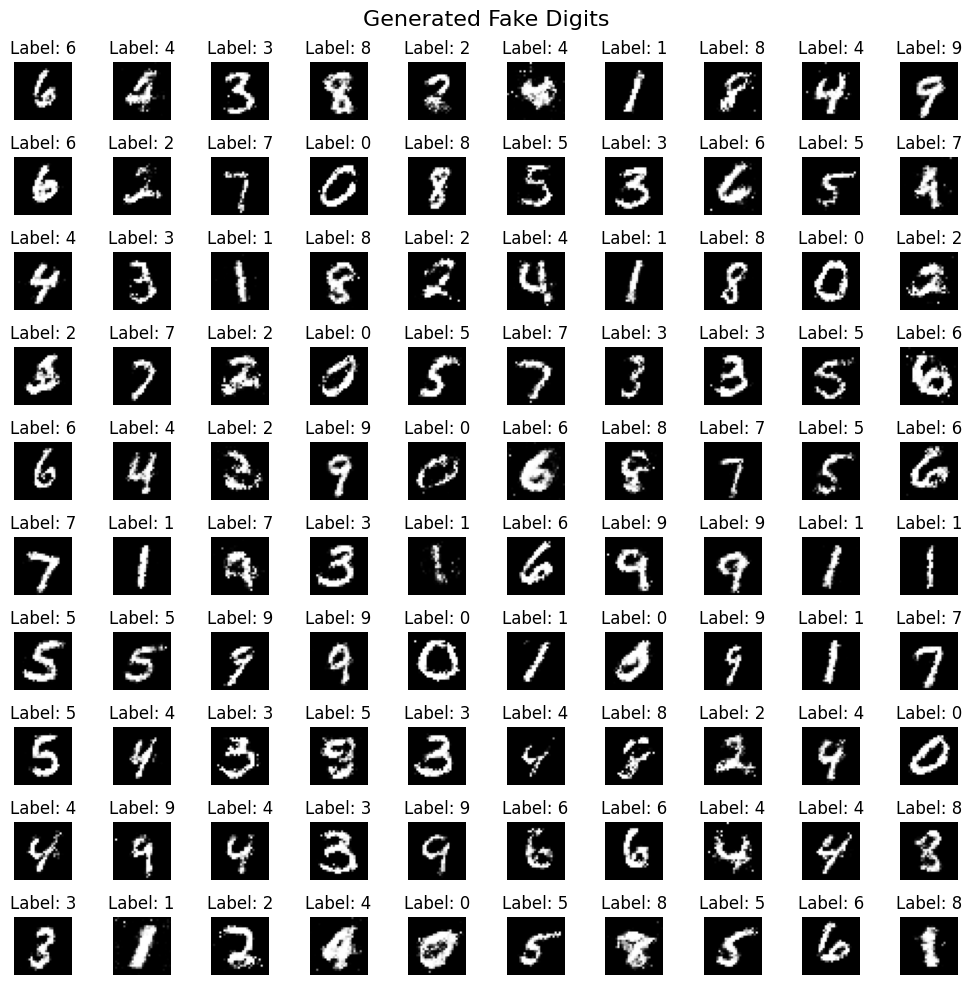

Epoch [27/50], Step [200/600], d_loss: 1.1684, g_loss: 1.0554, D(x): 0.55, D(G(z)): 0.34
Epoch [27/50], Step [400/600], d_loss: 1.0562, g_loss: 1.1486, D(x): 0.59, D(G(z)): 0.32
Epoch [27/50], Step [600/600], d_loss: 1.0403, g_loss: 1.2589, D(x): 0.68, D(G(z)): 0.41
Epoch [27/50], Average d_loss: 1.1022, Average g_loss: 1.2200


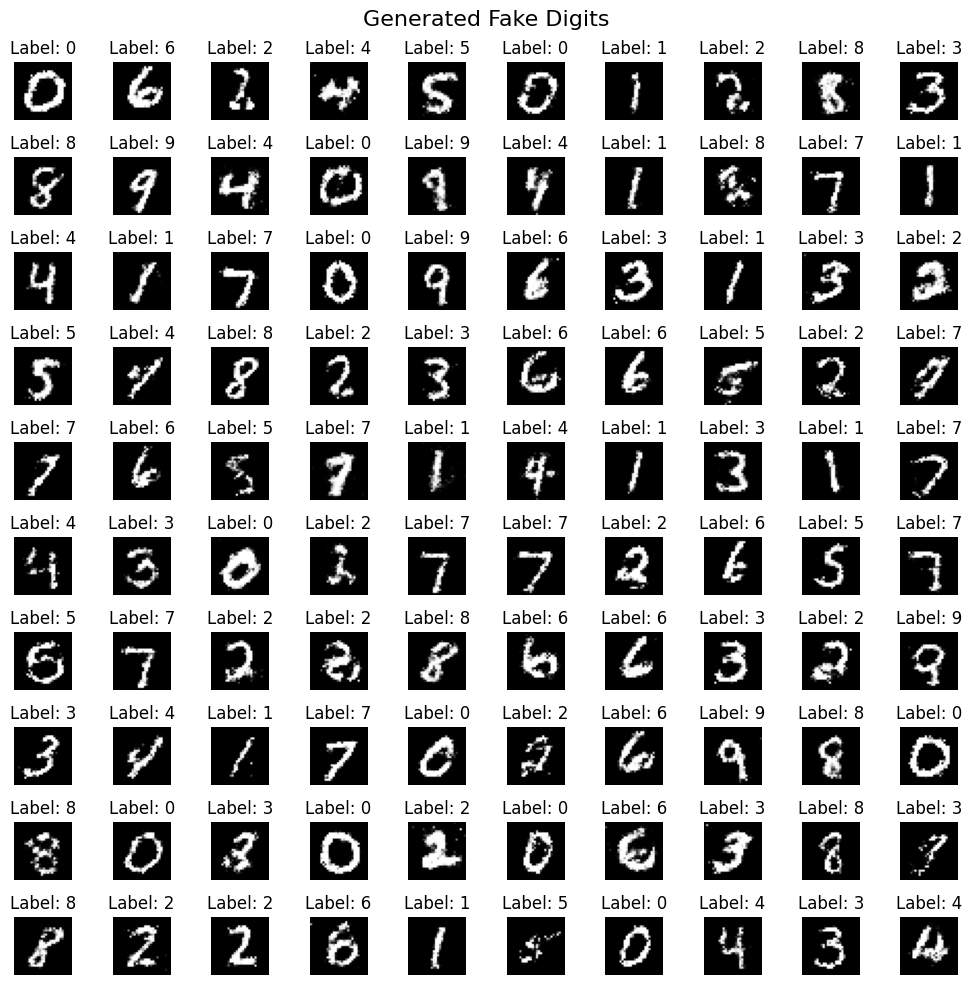

Epoch [28/50], Step [200/600], d_loss: 1.1398, g_loss: 1.1613, D(x): 0.60, D(G(z)): 0.39
Epoch [28/50], Step [400/600], d_loss: 1.0653, g_loss: 1.3688, D(x): 0.62, D(G(z)): 0.35
Epoch [28/50], Step [600/600], d_loss: 1.0540, g_loss: 1.2887, D(x): 0.66, D(G(z)): 0.39
Epoch [28/50], Average d_loss: 1.1067, Average g_loss: 1.2125


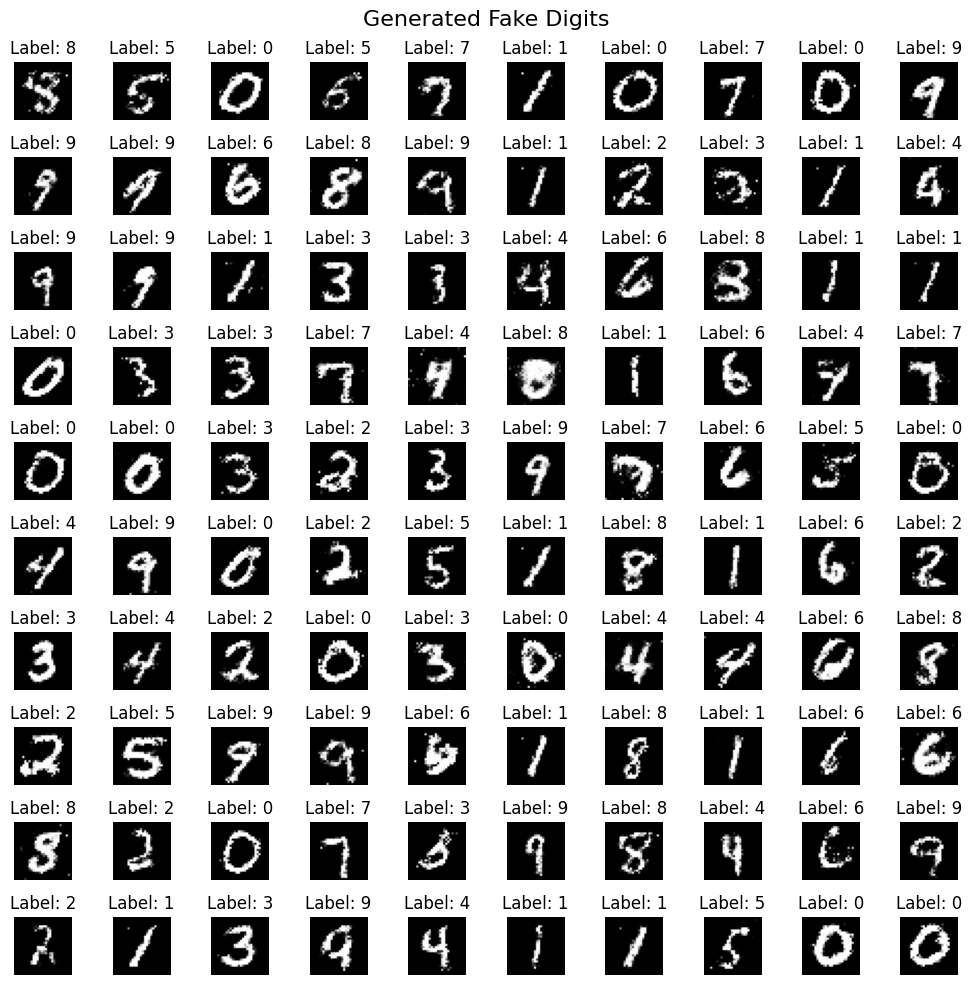

Epoch [29/50], Step [200/600], d_loss: 1.1925, g_loss: 1.2723, D(x): 0.60, D(G(z)): 0.40
Epoch [29/50], Step [400/600], d_loss: 1.0116, g_loss: 1.3143, D(x): 0.67, D(G(z)): 0.38
Epoch [29/50], Step [600/600], d_loss: 1.1392, g_loss: 1.2079, D(x): 0.64, D(G(z)): 0.41
Epoch [29/50], Average d_loss: 1.1101, Average g_loss: 1.2097


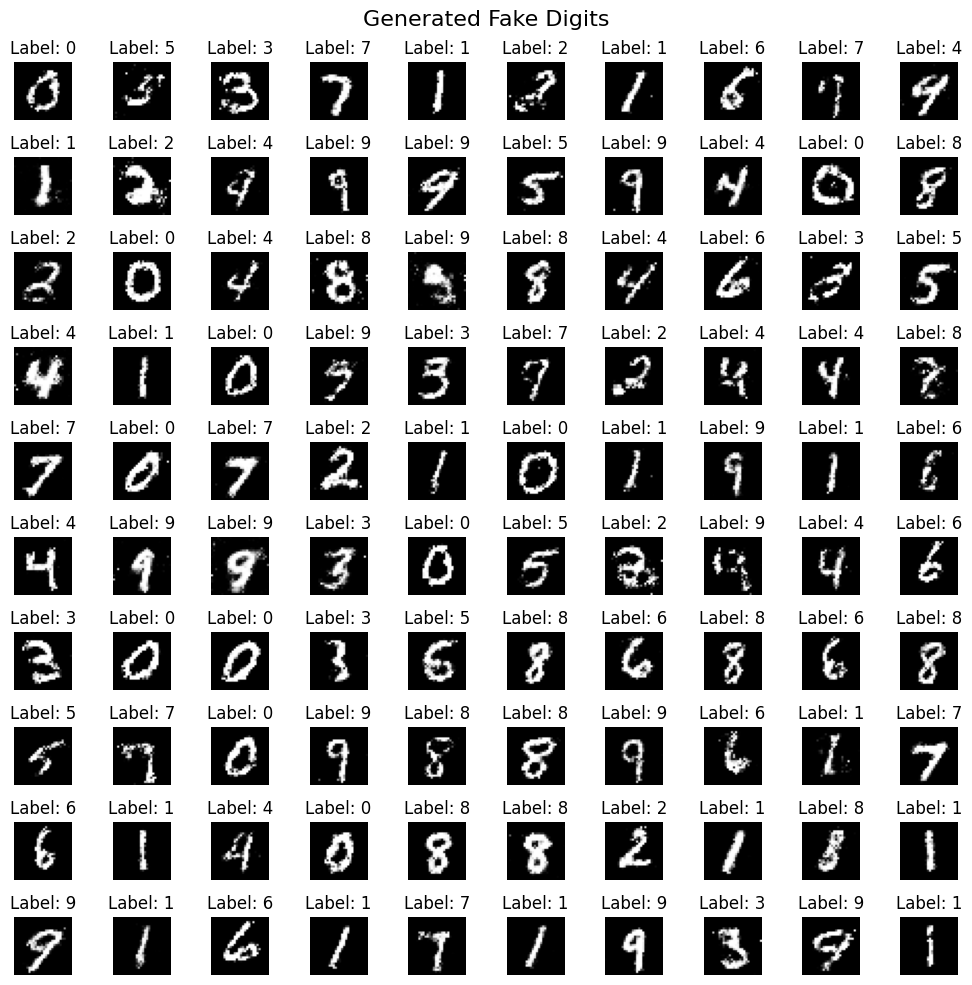

Epoch [30/50], Step [200/600], d_loss: 1.1412, g_loss: 1.1129, D(x): 0.58, D(G(z)): 0.37
Epoch [30/50], Step [400/600], d_loss: 1.0608, g_loss: 1.0132, D(x): 0.69, D(G(z)): 0.42
Epoch [30/50], Step [600/600], d_loss: 1.1051, g_loss: 1.2384, D(x): 0.62, D(G(z)): 0.39
Epoch [30/50], Average d_loss: 1.1194, Average g_loss: 1.1850


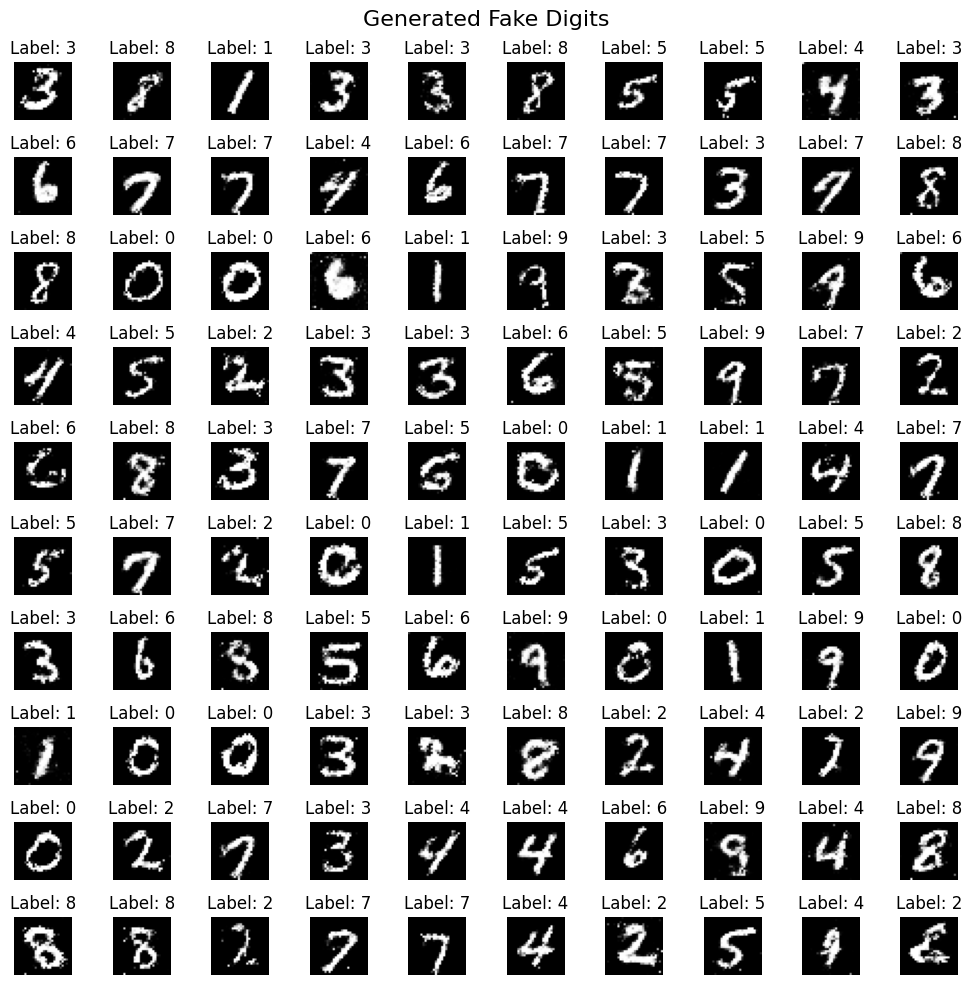

Epoch [31/50], Step [200/600], d_loss: 1.1546, g_loss: 1.2092, D(x): 0.64, D(G(z)): 0.43
Epoch [31/50], Step [400/600], d_loss: 1.2492, g_loss: 1.0223, D(x): 0.55, D(G(z)): 0.39
Epoch [31/50], Step [600/600], d_loss: 1.0480, g_loss: 1.1330, D(x): 0.67, D(G(z)): 0.40
Epoch [31/50], Average d_loss: 1.1196, Average g_loss: 1.1819


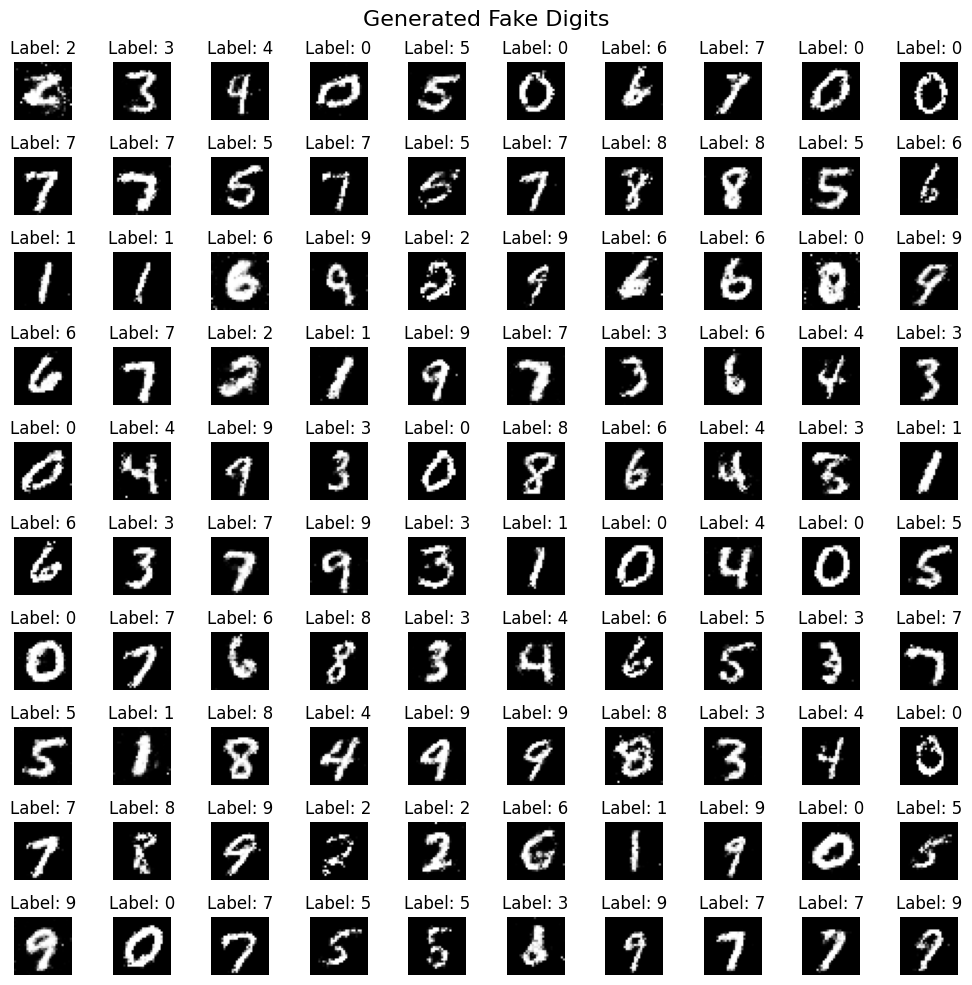

Epoch [32/50], Step [200/600], d_loss: 1.2082, g_loss: 1.0863, D(x): 0.59, D(G(z)): 0.38
Epoch [32/50], Step [400/600], d_loss: 1.1026, g_loss: 1.2306, D(x): 0.62, D(G(z)): 0.38
Epoch [32/50], Step [600/600], d_loss: 1.0865, g_loss: 1.2365, D(x): 0.65, D(G(z)): 0.40
Epoch [32/50], Average d_loss: 1.1234, Average g_loss: 1.1771


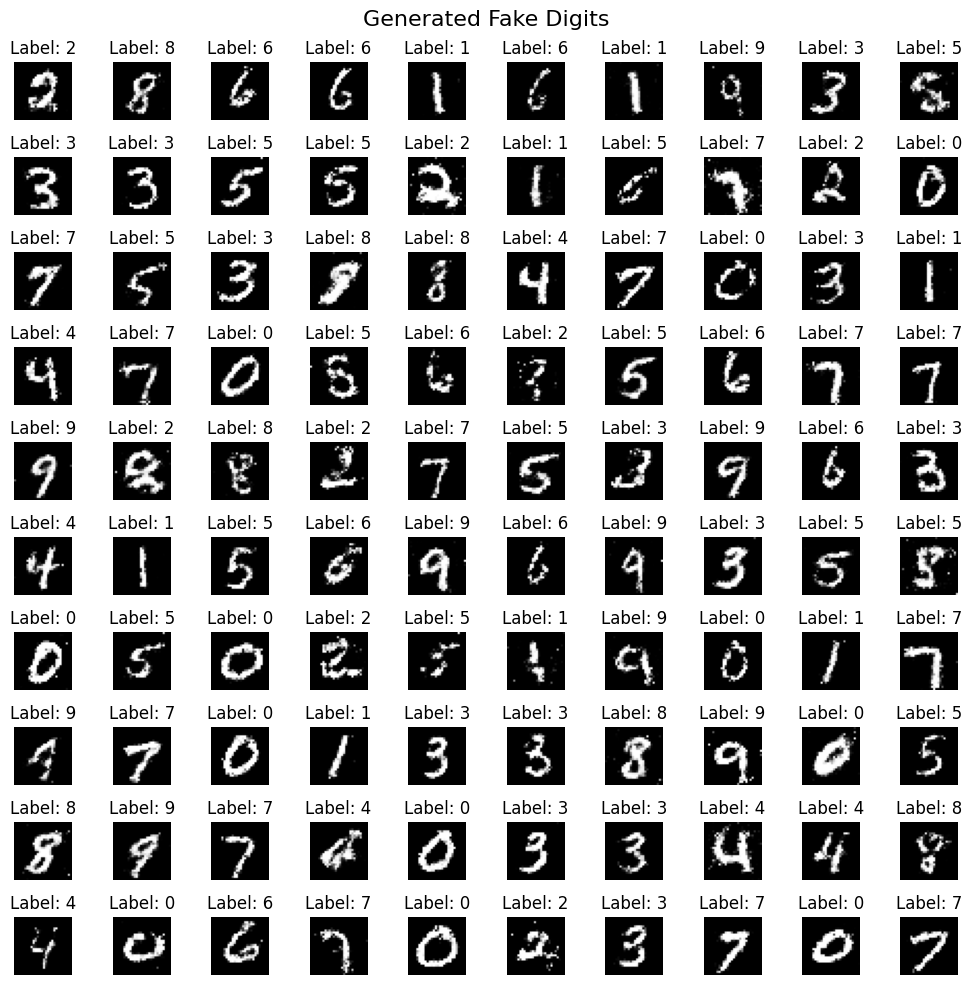

Epoch [33/50], Step [200/600], d_loss: 1.2911, g_loss: 1.1388, D(x): 0.56, D(G(z)): 0.42
Epoch [33/50], Step [400/600], d_loss: 1.1705, g_loss: 1.1579, D(x): 0.58, D(G(z)): 0.35
Epoch [33/50], Step [600/600], d_loss: 1.0837, g_loss: 1.2703, D(x): 0.62, D(G(z)): 0.35
Epoch [33/50], Average d_loss: 1.1275, Average g_loss: 1.1661


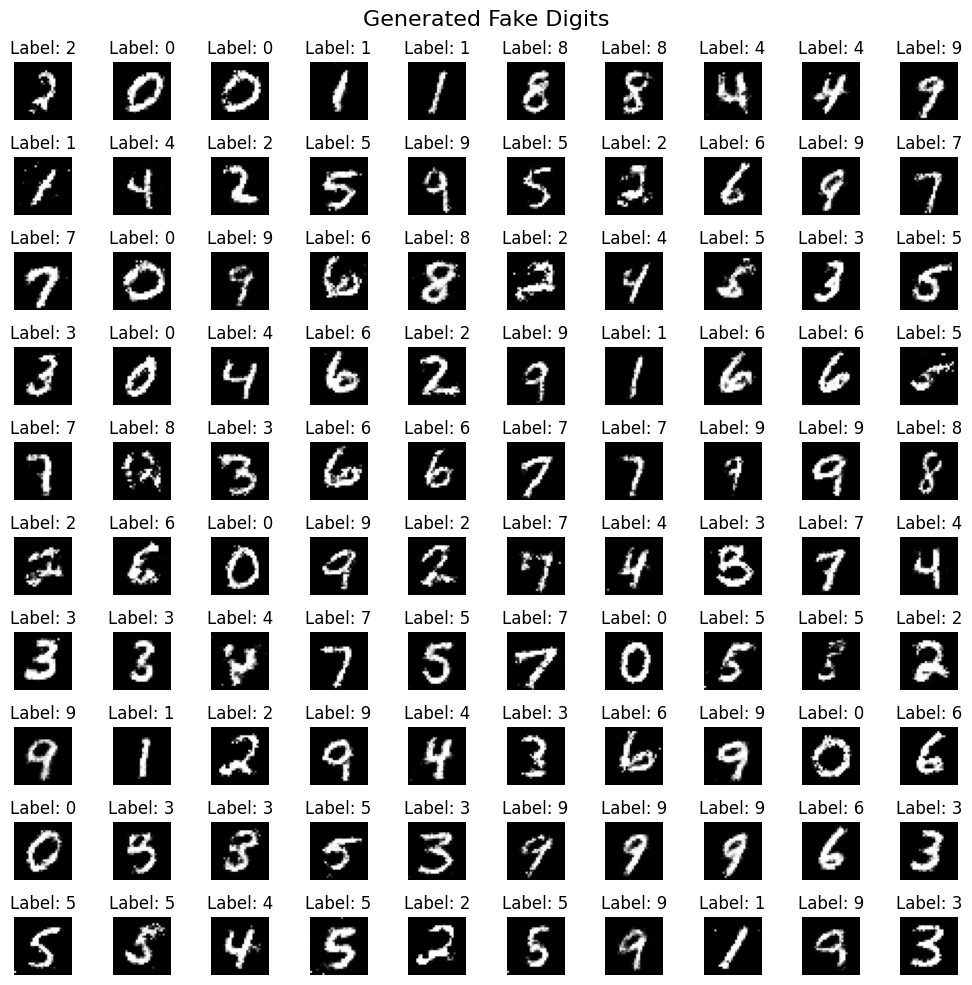

Epoch [34/50], Step [200/600], d_loss: 1.1554, g_loss: 1.0272, D(x): 0.61, D(G(z)): 0.39
Epoch [34/50], Step [400/600], d_loss: 1.1932, g_loss: 1.1621, D(x): 0.55, D(G(z)): 0.37
Epoch [34/50], Step [600/600], d_loss: 1.1483, g_loss: 1.0415, D(x): 0.59, D(G(z)): 0.38
Epoch [34/50], Average d_loss: 1.1312, Average g_loss: 1.1632


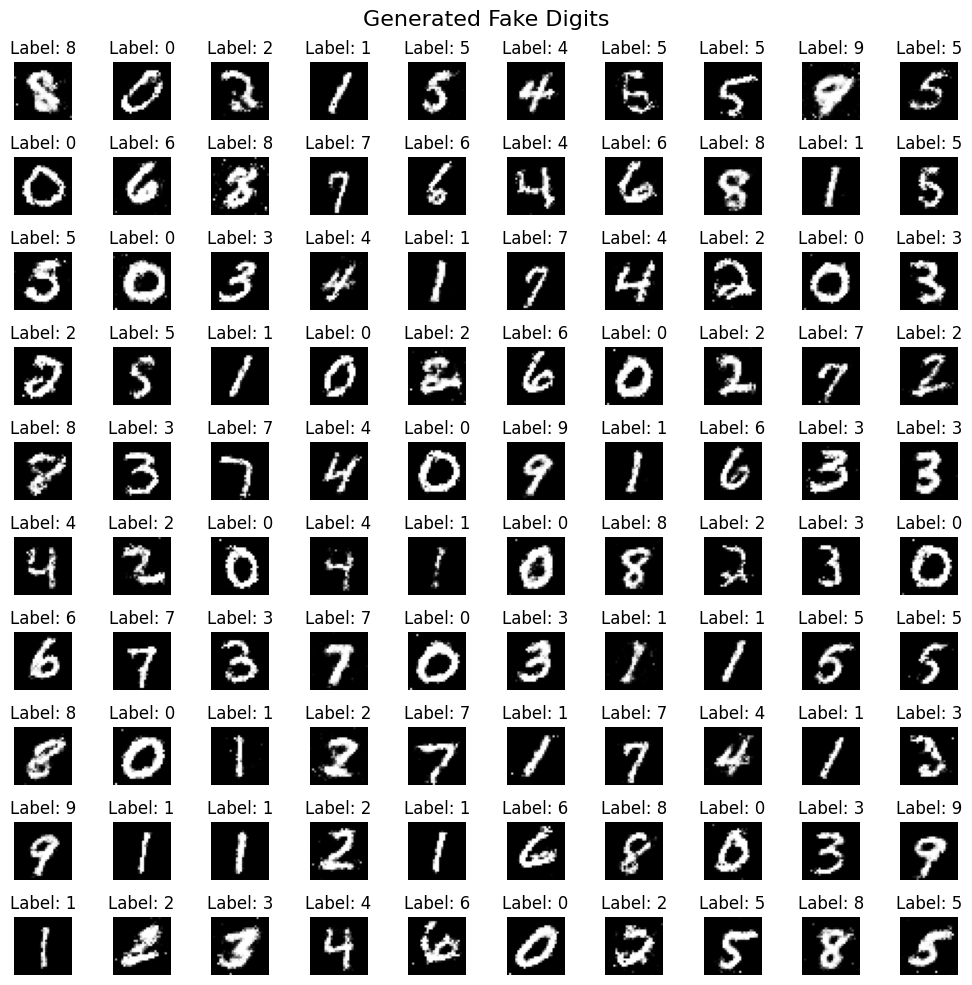

Epoch [35/50], Step [200/600], d_loss: 1.1110, g_loss: 1.1669, D(x): 0.64, D(G(z)): 0.41
Epoch [35/50], Step [400/600], d_loss: 1.1393, g_loss: 1.1677, D(x): 0.63, D(G(z)): 0.40
Epoch [35/50], Step [600/600], d_loss: 1.1243, g_loss: 1.1172, D(x): 0.63, D(G(z)): 0.43
Epoch [35/50], Average d_loss: 1.1366, Average g_loss: 1.1562


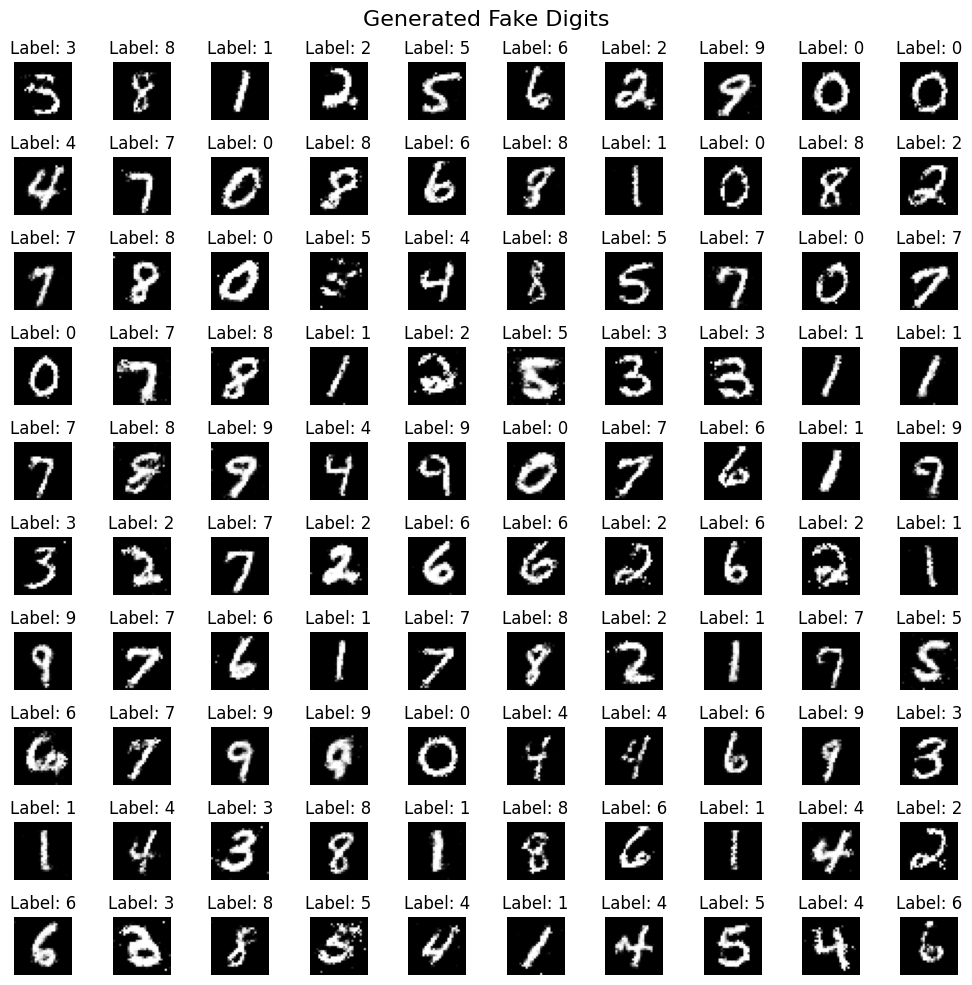

Epoch [36/50], Step [200/600], d_loss: 1.1950, g_loss: 1.1119, D(x): 0.63, D(G(z)): 0.43
Epoch [36/50], Step [400/600], d_loss: 1.1432, g_loss: 1.1207, D(x): 0.65, D(G(z)): 0.44
Epoch [36/50], Step [600/600], d_loss: 1.1749, g_loss: 1.1238, D(x): 0.57, D(G(z)): 0.38
Epoch [36/50], Average d_loss: 1.1401, Average g_loss: 1.1387


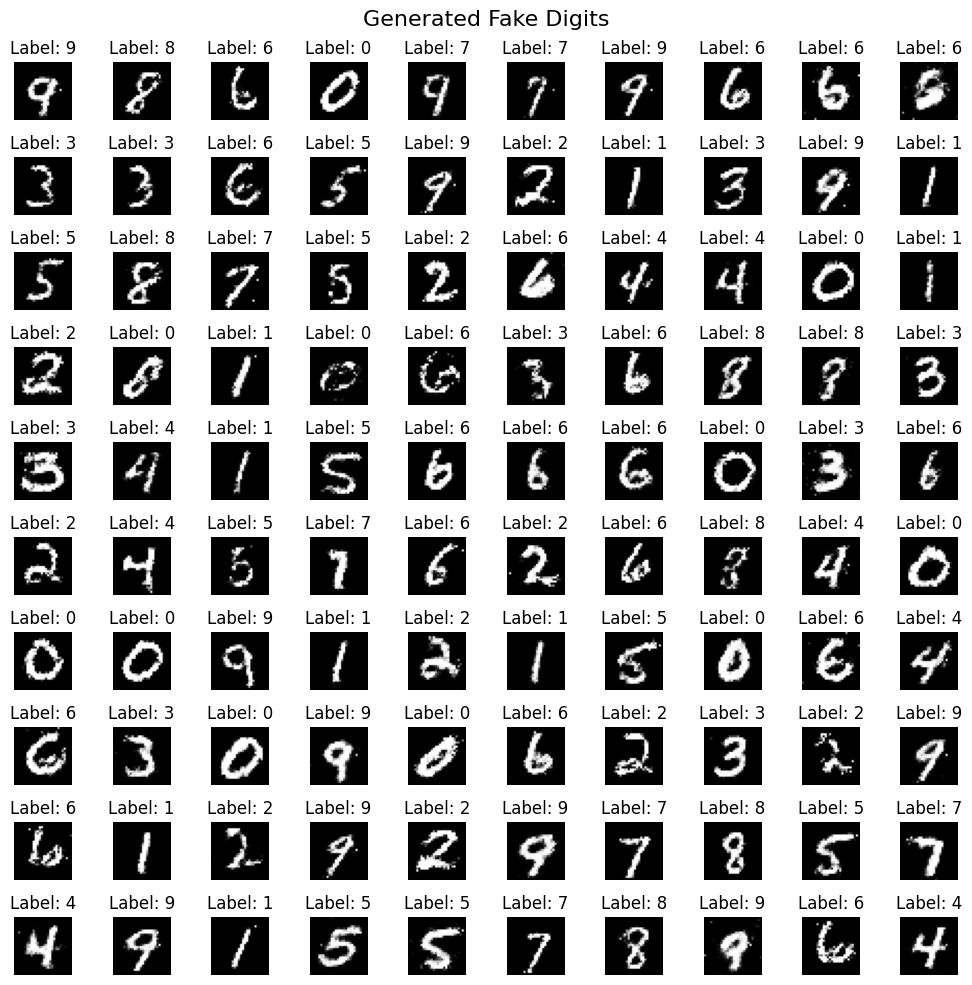

Epoch [37/50], Step [200/600], d_loss: 1.1728, g_loss: 1.1925, D(x): 0.60, D(G(z)): 0.41
Epoch [37/50], Step [400/600], d_loss: 1.1620, g_loss: 1.2608, D(x): 0.62, D(G(z)): 0.37
Epoch [37/50], Step [600/600], d_loss: 1.0749, g_loss: 1.0800, D(x): 0.66, D(G(z)): 0.41
Epoch [37/50], Average d_loss: 1.1398, Average g_loss: 1.1424


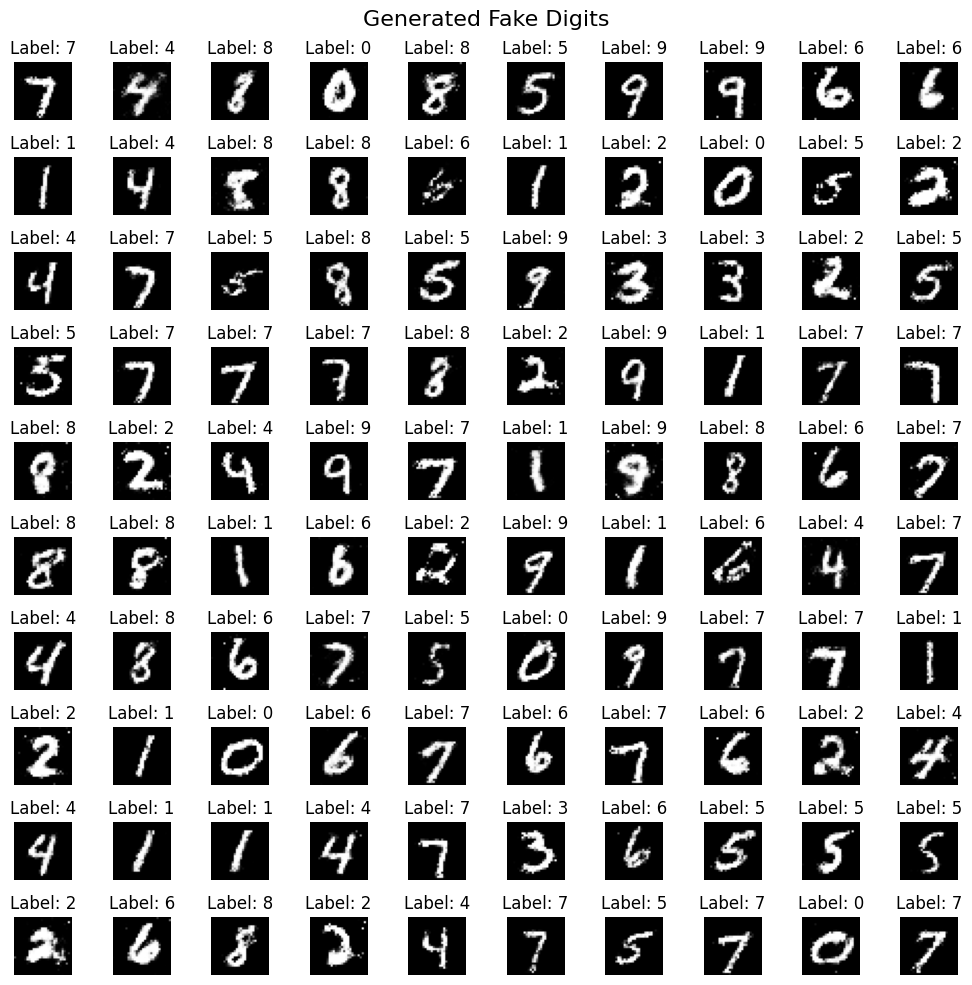

Epoch [38/50], Step [200/600], d_loss: 1.0274, g_loss: 1.1639, D(x): 0.68, D(G(z)): 0.39
Epoch [38/50], Step [400/600], d_loss: 1.1729, g_loss: 1.0057, D(x): 0.62, D(G(z)): 0.42
Epoch [38/50], Step [600/600], d_loss: 1.2037, g_loss: 1.1425, D(x): 0.52, D(G(z)): 0.34
Epoch [38/50], Average d_loss: 1.1389, Average g_loss: 1.1434


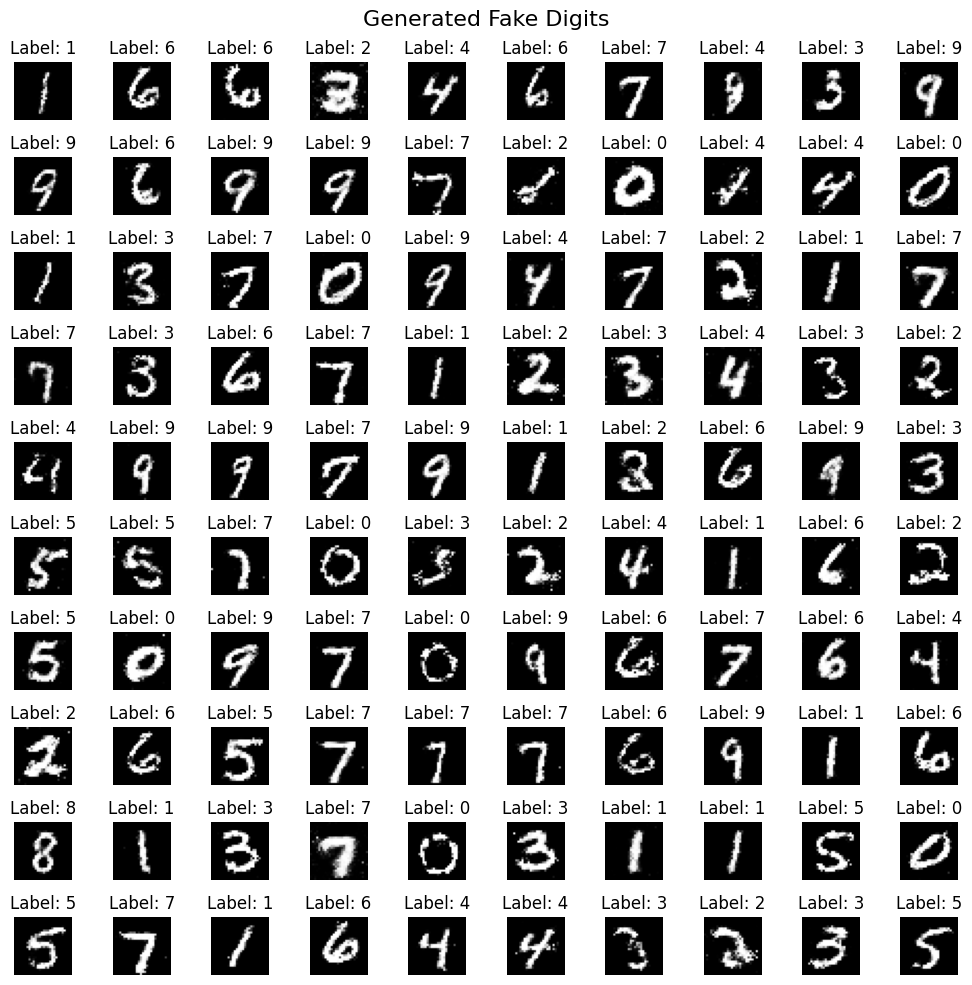

Epoch [39/50], Step [200/600], d_loss: 1.1038, g_loss: 1.1402, D(x): 0.54, D(G(z)): 0.30
Epoch [39/50], Step [400/600], d_loss: 1.1694, g_loss: 1.2349, D(x): 0.56, D(G(z)): 0.36
Epoch [39/50], Step [600/600], d_loss: 1.2316, g_loss: 1.0543, D(x): 0.53, D(G(z)): 0.38
Epoch [39/50], Average d_loss: 1.1466, Average g_loss: 1.1260


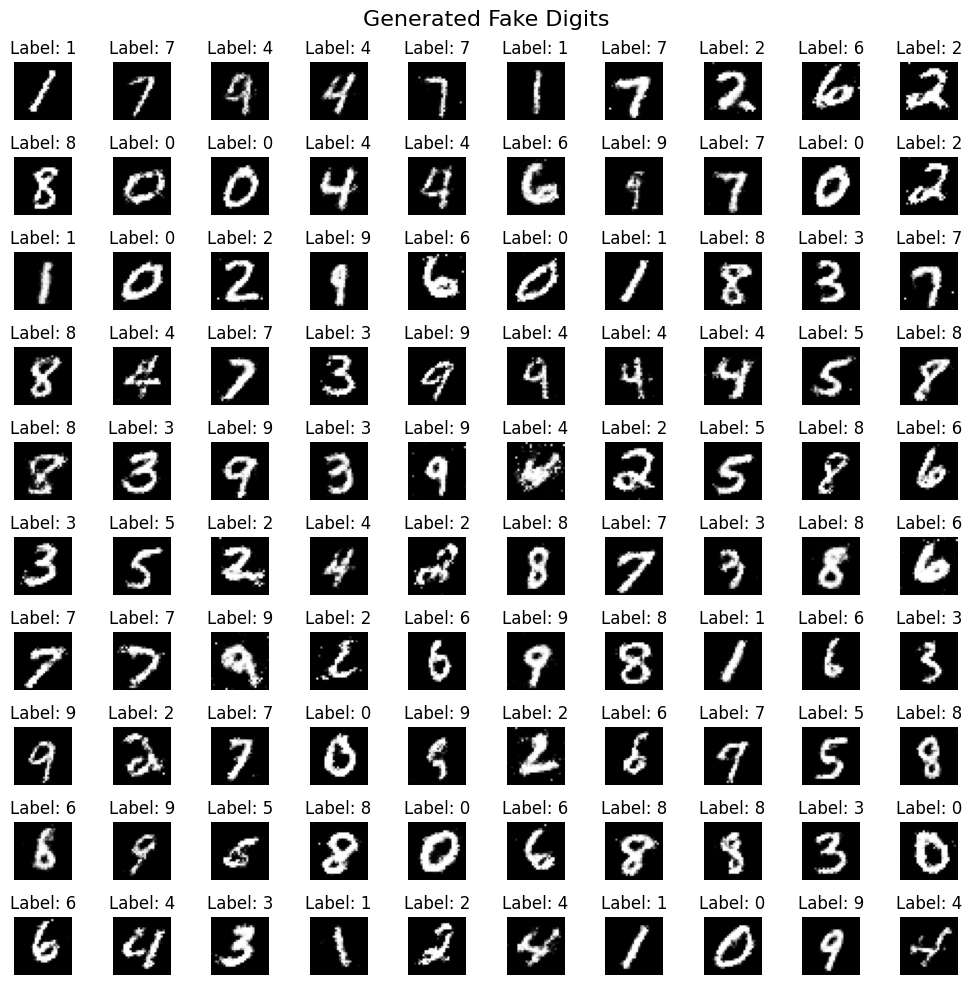

Epoch [40/50], Step [200/600], d_loss: 1.1264, g_loss: 1.1635, D(x): 0.53, D(G(z)): 0.31
Epoch [40/50], Step [400/600], d_loss: 1.1779, g_loss: 0.9994, D(x): 0.60, D(G(z)): 0.41
Epoch [40/50], Step [600/600], d_loss: 1.0919, g_loss: 1.0733, D(x): 0.63, D(G(z)): 0.38
Epoch [40/50], Average d_loss: 1.1473, Average g_loss: 1.1289


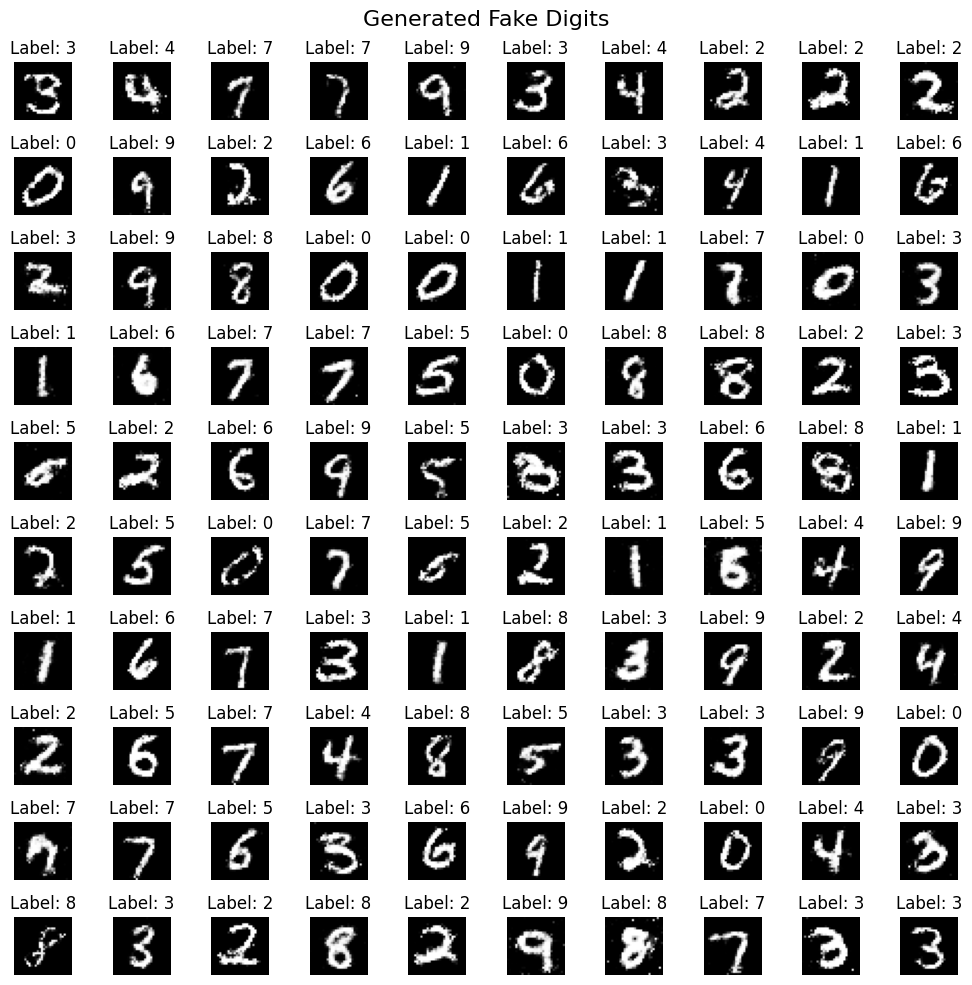

Epoch [41/50], Step [200/600], d_loss: 1.1363, g_loss: 1.1386, D(x): 0.63, D(G(z)): 0.41
Epoch [41/50], Step [400/600], d_loss: 1.1576, g_loss: 0.9551, D(x): 0.59, D(G(z)): 0.37
Epoch [41/50], Step [600/600], d_loss: 1.1291, g_loss: 1.0820, D(x): 0.62, D(G(z)): 0.40
Epoch [41/50], Average d_loss: 1.1448, Average g_loss: 1.1335


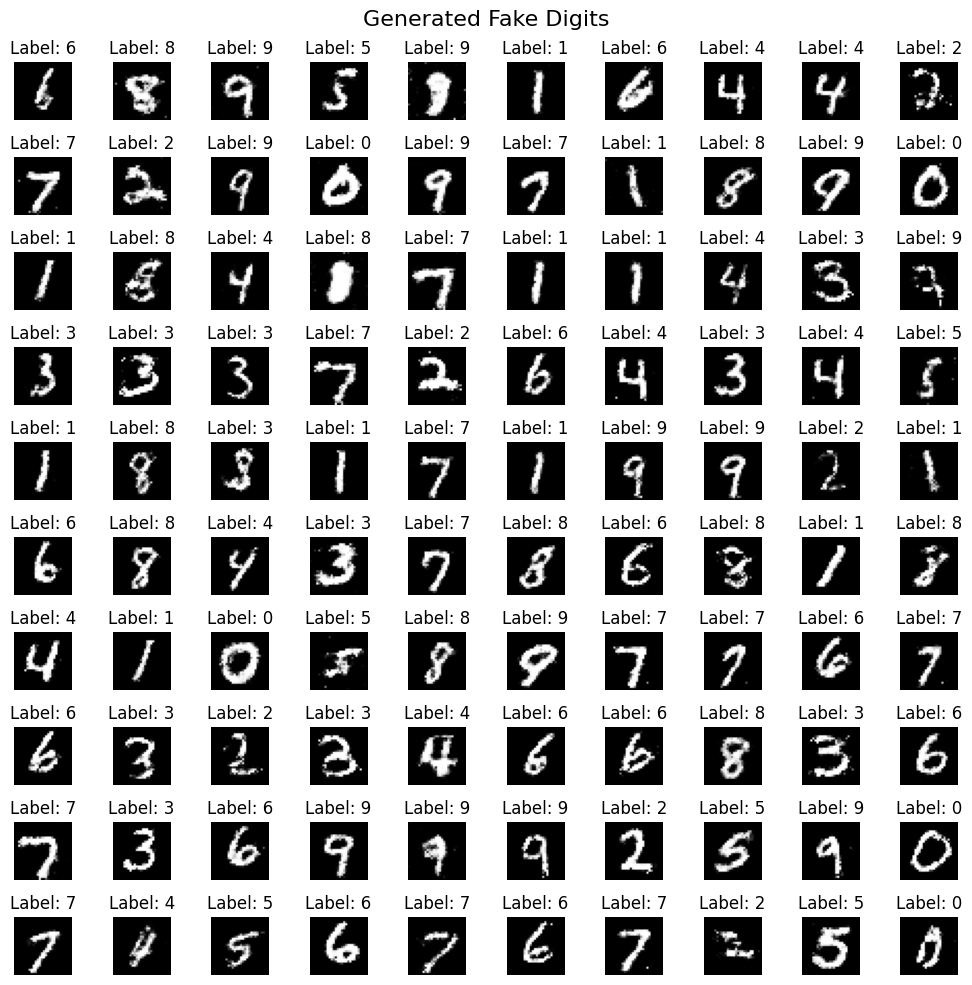

Epoch [42/50], Step [200/600], d_loss: 1.0872, g_loss: 1.1905, D(x): 0.65, D(G(z)): 0.42
Epoch [42/50], Step [400/600], d_loss: 1.0911, g_loss: 0.9614, D(x): 0.62, D(G(z)): 0.39
Epoch [42/50], Step [600/600], d_loss: 1.1204, g_loss: 0.9963, D(x): 0.57, D(G(z)): 0.35
Epoch [42/50], Average d_loss: 1.1505, Average g_loss: 1.1217


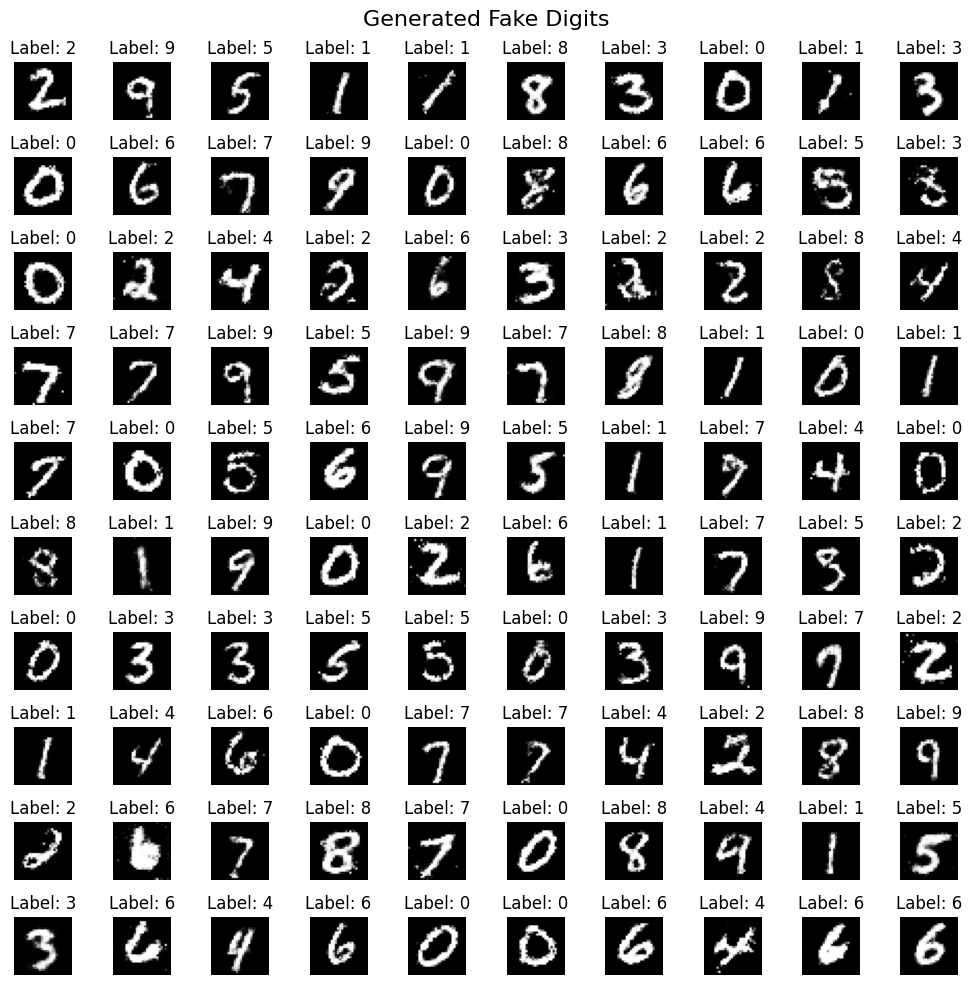

Epoch [43/50], Step [200/600], d_loss: 1.1424, g_loss: 0.9976, D(x): 0.58, D(G(z)): 0.38
Epoch [43/50], Step [400/600], d_loss: 1.1680, g_loss: 1.1881, D(x): 0.62, D(G(z)): 0.43
Epoch [43/50], Step [600/600], d_loss: 1.1881, g_loss: 1.0609, D(x): 0.64, D(G(z)): 0.45
Epoch [43/50], Average d_loss: 1.1550, Average g_loss: 1.1158


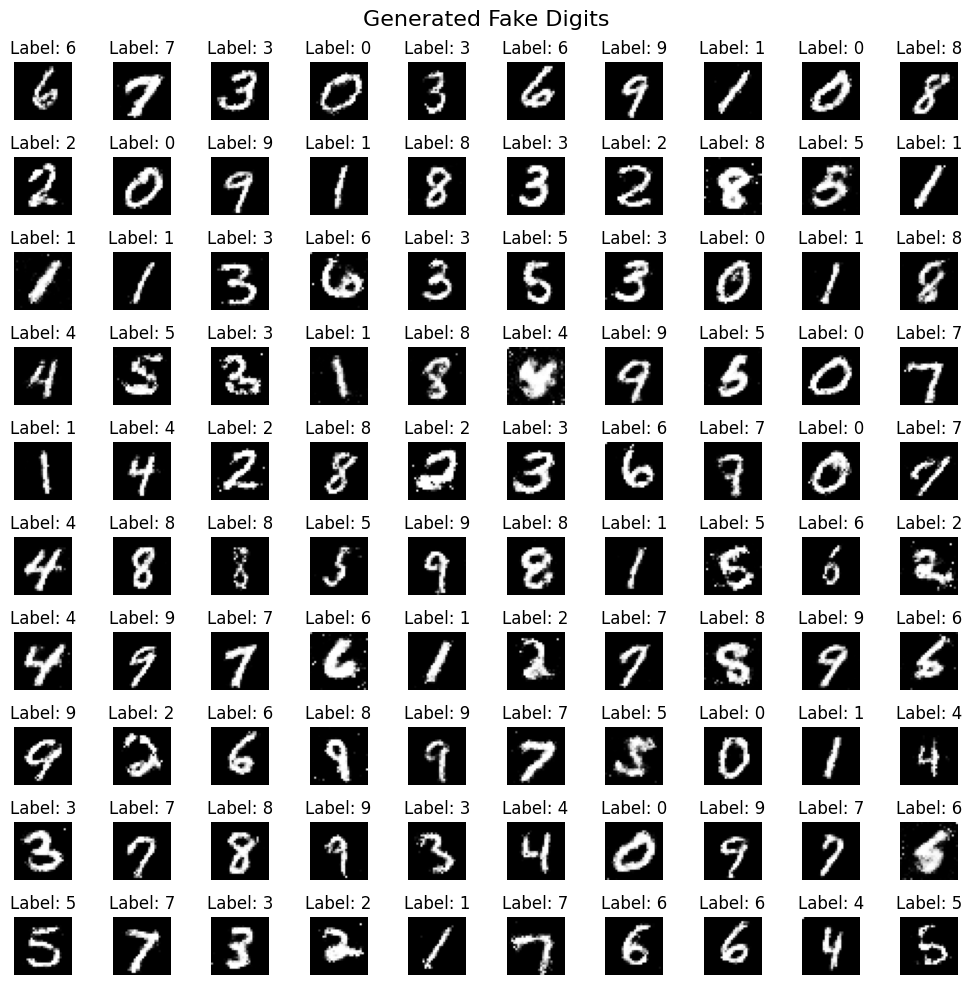

Epoch [44/50], Step [200/600], d_loss: 1.1816, g_loss: 1.1837, D(x): 0.60, D(G(z)): 0.40
Epoch [44/50], Step [400/600], d_loss: 1.2103, g_loss: 1.1805, D(x): 0.59, D(G(z)): 0.41
Epoch [44/50], Step [600/600], d_loss: 1.1635, g_loss: 1.1268, D(x): 0.55, D(G(z)): 0.36
Epoch [44/50], Average d_loss: 1.1589, Average g_loss: 1.1092


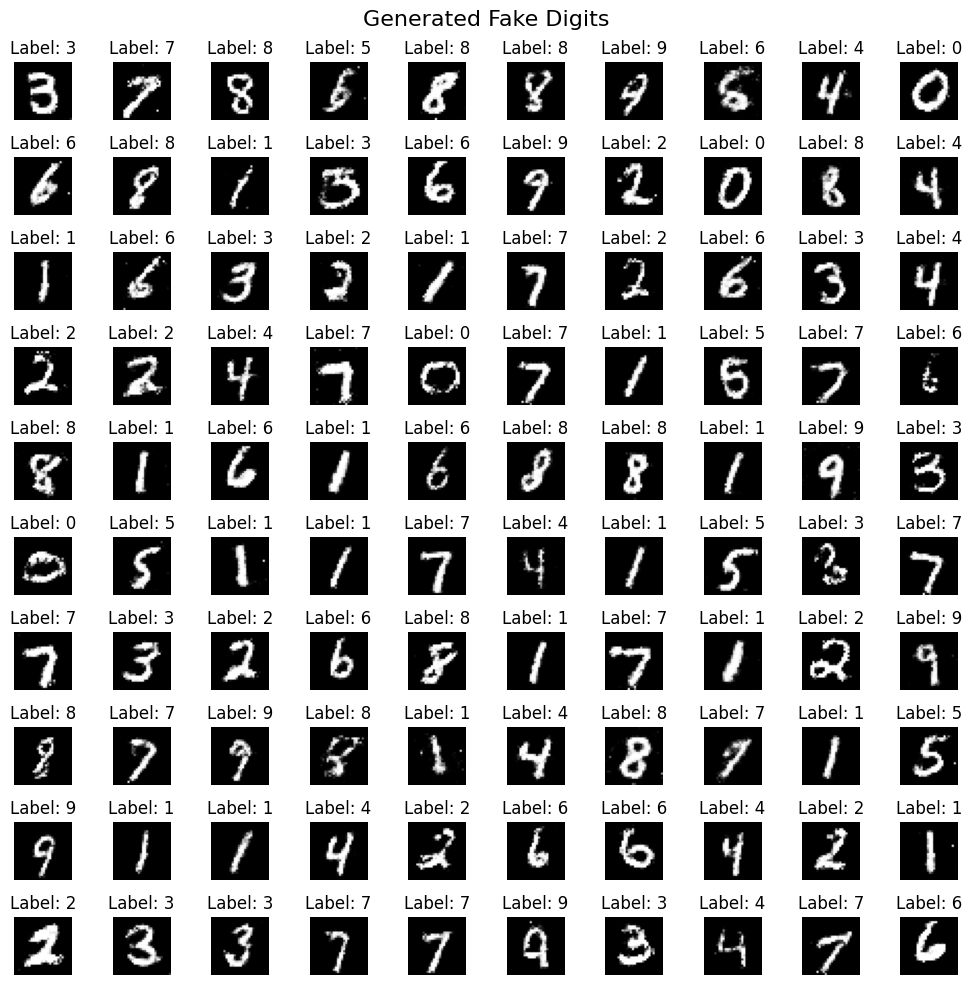

Epoch [45/50], Step [200/600], d_loss: 1.1324, g_loss: 1.1604, D(x): 0.60, D(G(z)): 0.39
Epoch [45/50], Step [400/600], d_loss: 1.1602, g_loss: 1.0213, D(x): 0.55, D(G(z)): 0.37
Epoch [45/50], Step [600/600], d_loss: 1.1778, g_loss: 1.1015, D(x): 0.59, D(G(z)): 0.40
Epoch [45/50], Average d_loss: 1.1612, Average g_loss: 1.1021


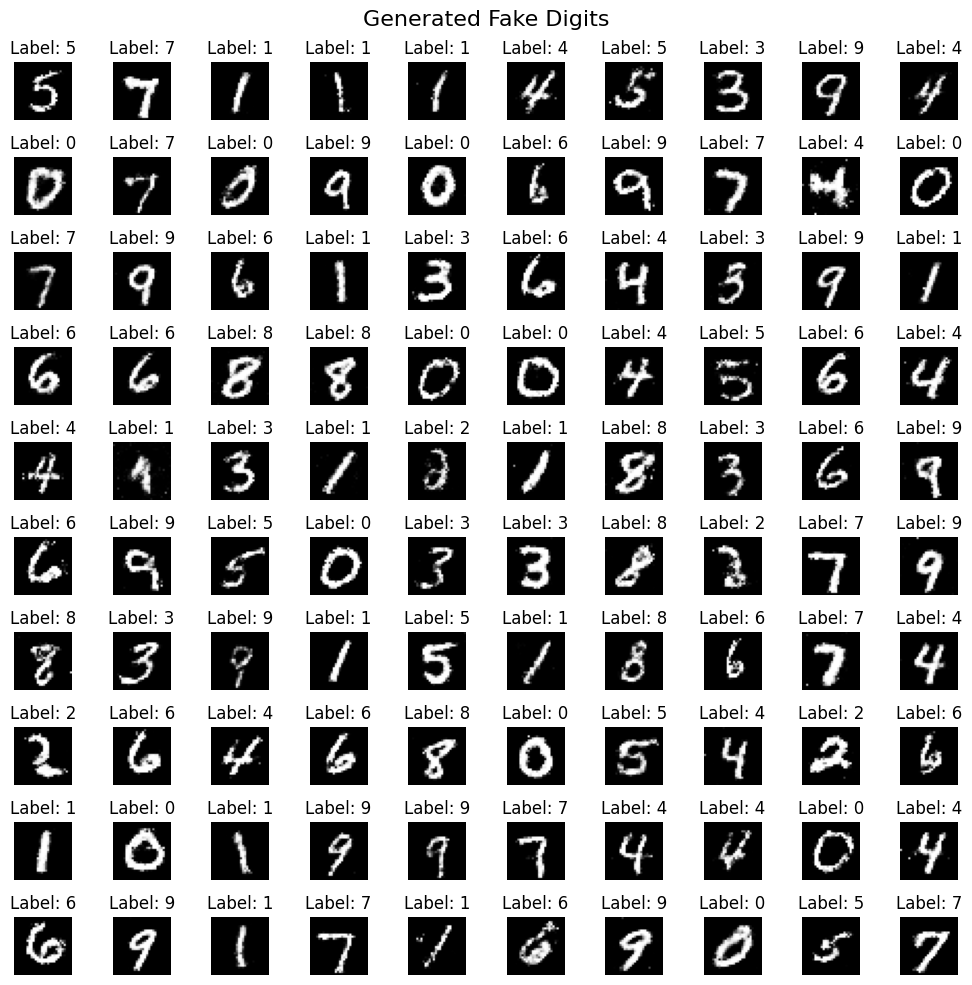

Epoch [46/50], Step [200/600], d_loss: 1.2267, g_loss: 1.1400, D(x): 0.53, D(G(z)): 0.34
Epoch [46/50], Step [400/600], d_loss: 1.1084, g_loss: 1.2131, D(x): 0.61, D(G(z)): 0.39
Epoch [46/50], Step [600/600], d_loss: 1.1824, g_loss: 0.9870, D(x): 0.60, D(G(z)): 0.42
Epoch [46/50], Average d_loss: 1.1599, Average g_loss: 1.1056


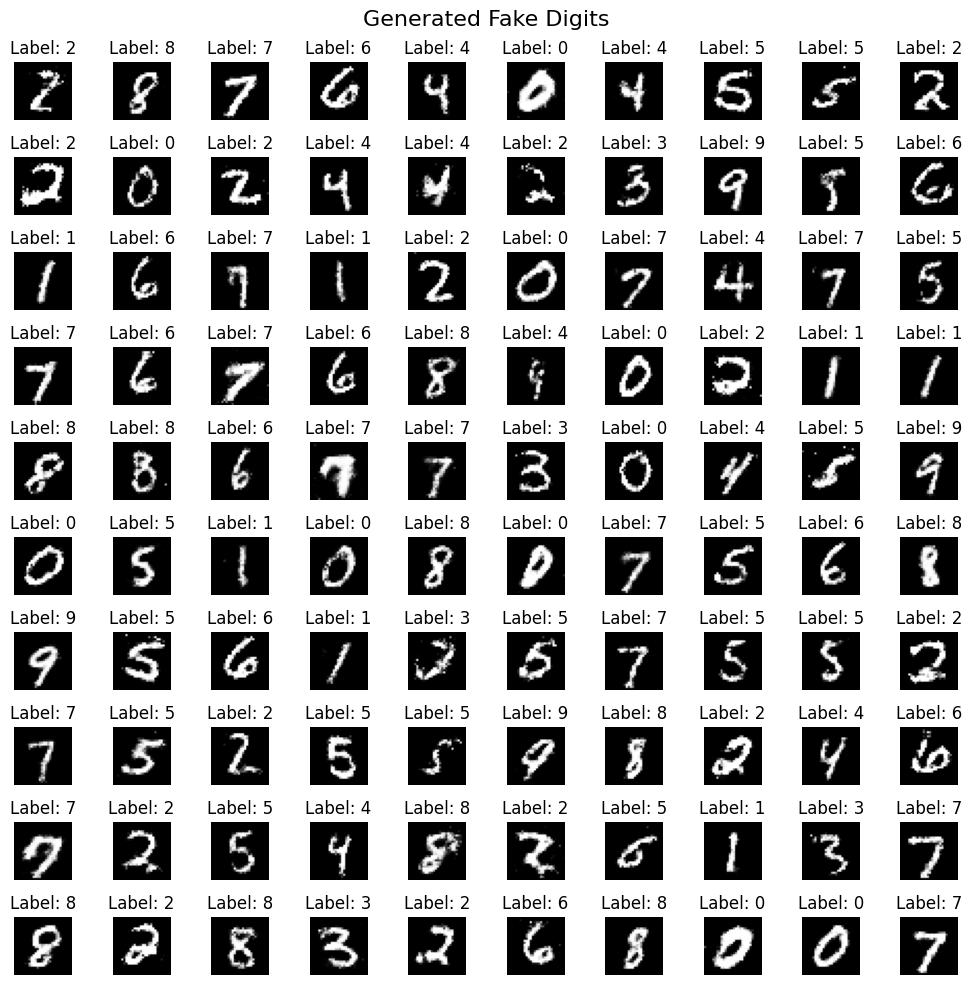

Epoch [47/50], Step [200/600], d_loss: 1.1246, g_loss: 1.0904, D(x): 0.62, D(G(z)): 0.42
Epoch [47/50], Step [400/600], d_loss: 1.2037, g_loss: 1.1351, D(x): 0.62, D(G(z)): 0.45
Epoch [47/50], Step [600/600], d_loss: 1.1954, g_loss: 1.1232, D(x): 0.60, D(G(z)): 0.41
Epoch [47/50], Average d_loss: 1.1620, Average g_loss: 1.0994


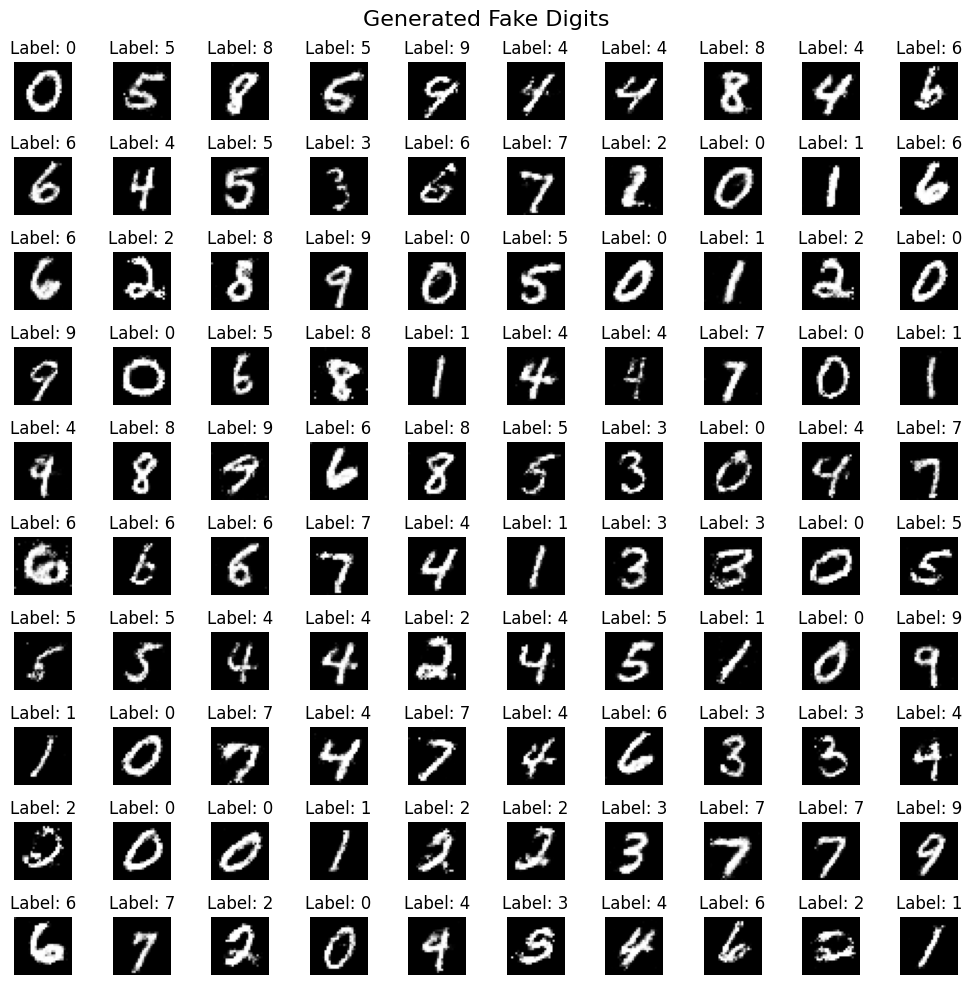

Epoch [48/50], Step [200/600], d_loss: 1.1746, g_loss: 0.9586, D(x): 0.58, D(G(z)): 0.39
Epoch [48/50], Step [400/600], d_loss: 1.1188, g_loss: 0.9923, D(x): 0.63, D(G(z)): 0.41
Epoch [48/50], Step [600/600], d_loss: 1.1033, g_loss: 1.2383, D(x): 0.60, D(G(z)): 0.39
Epoch [48/50], Average d_loss: 1.1659, Average g_loss: 1.0947


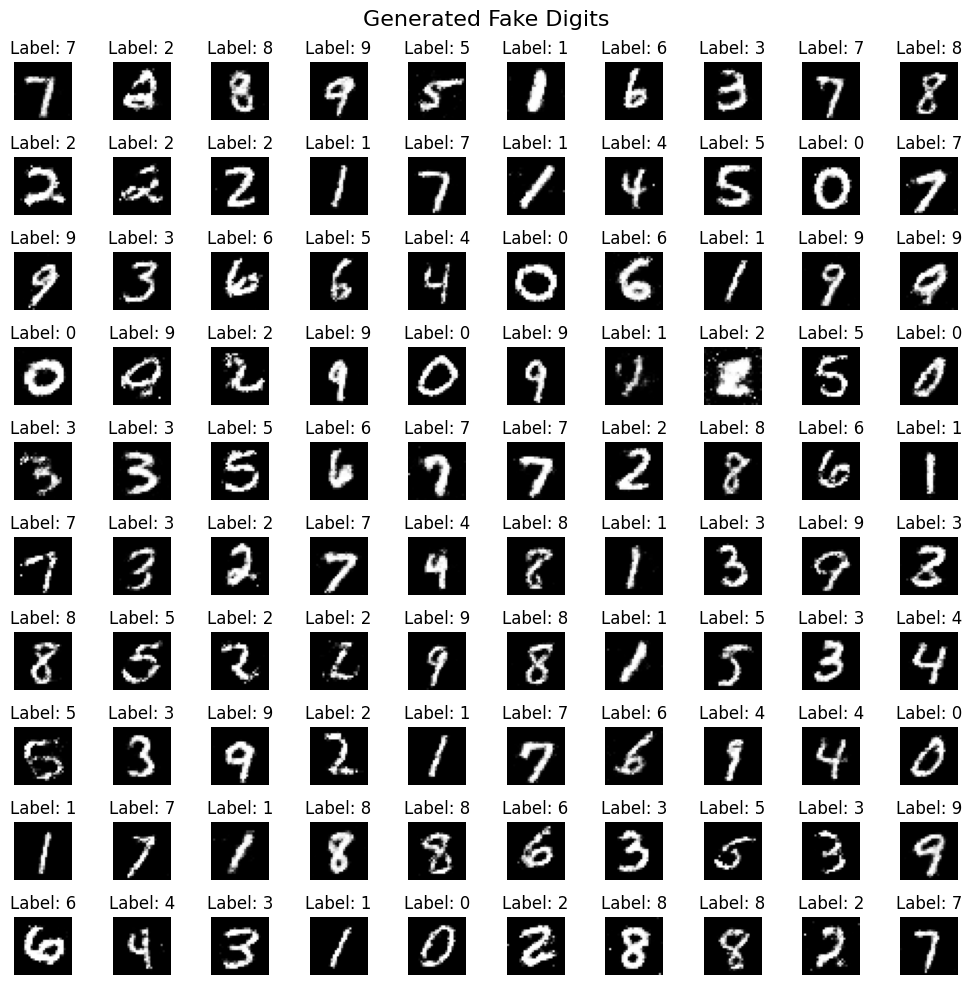

Epoch [49/50], Step [200/600], d_loss: 1.1982, g_loss: 1.0115, D(x): 0.60, D(G(z)): 0.41
Epoch [49/50], Step [400/600], d_loss: 1.2363, g_loss: 1.1419, D(x): 0.55, D(G(z)): 0.39
Epoch [49/50], Step [600/600], d_loss: 1.2002, g_loss: 1.0303, D(x): 0.62, D(G(z)): 0.45
Epoch [49/50], Average d_loss: 1.1643, Average g_loss: 1.0974


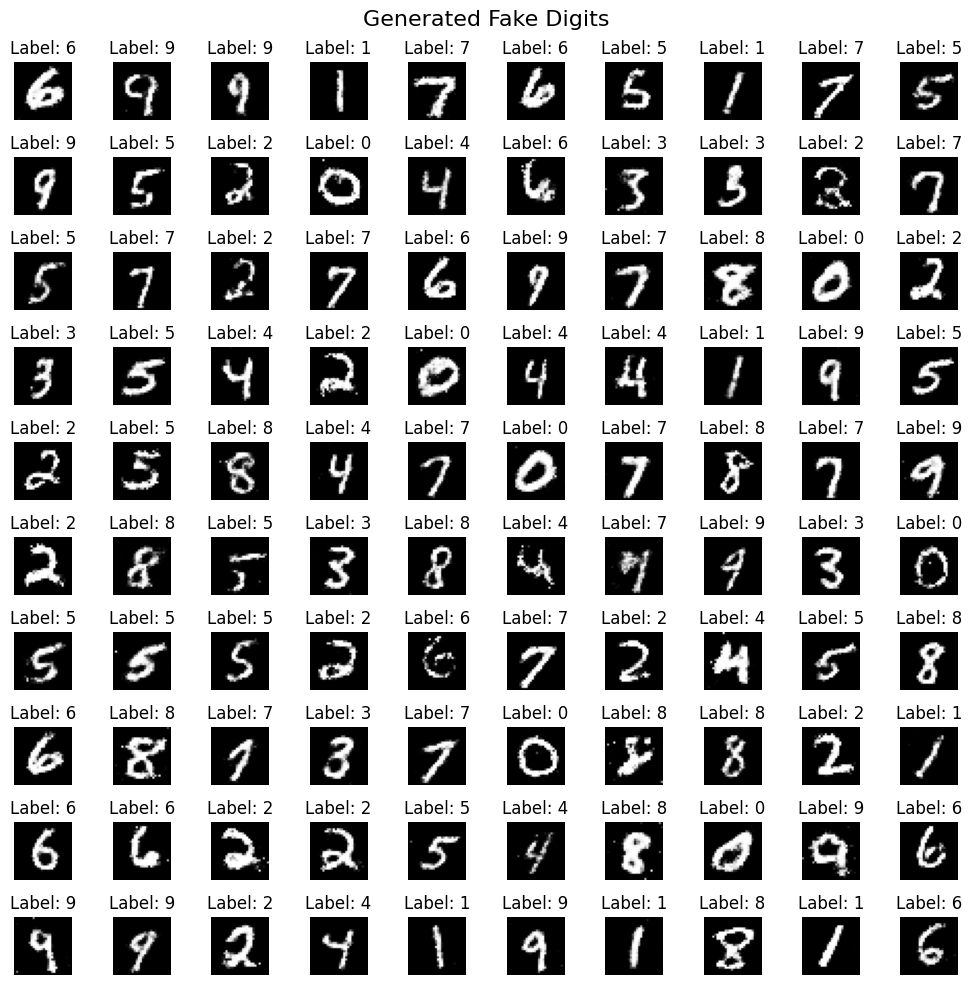

Epoch [50/50], Step [200/600], d_loss: 1.1366, g_loss: 1.1139, D(x): 0.58, D(G(z)): 0.36
Epoch [50/50], Step [400/600], d_loss: 1.1768, g_loss: 1.0846, D(x): 0.62, D(G(z)): 0.42
Epoch [50/50], Step [600/600], d_loss: 1.1169, g_loss: 1.1593, D(x): 0.60, D(G(z)): 0.38
Epoch [50/50], Average d_loss: 1.1690, Average g_loss: 1.0818


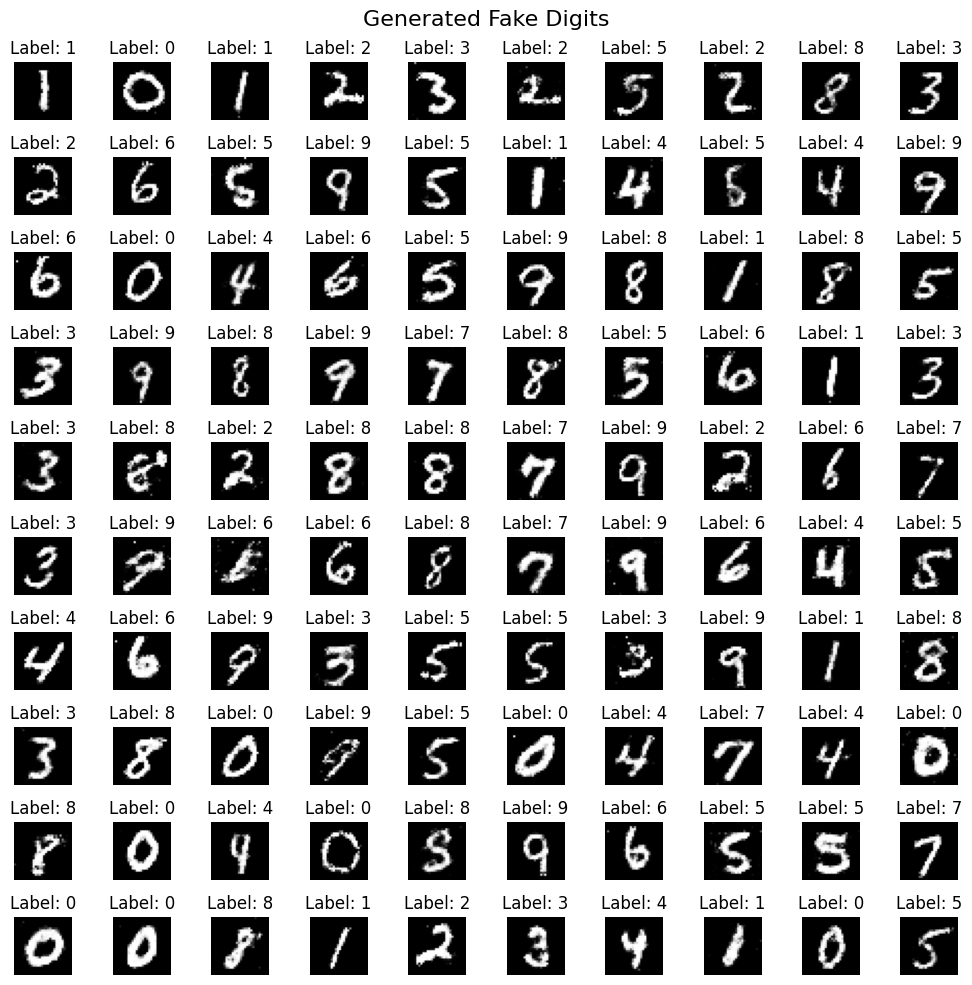

In [47]:
Results=[] # For question 3

for epoch in range(num_epochs):
    d_losses = []
    g_losses = []

    for i, (real_images, labels) in enumerate(data_loader):
        real_images, labels = real_images.to(device), labels.to(device)
        batch_size = real_images.size(0)

        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)
        fake_label_indices = torch.randint(0, num_classes, (batch_size,)).to(device)

        outputs = discriminator(real_images, labels)
        d_loss_real = criterion(outputs, real_labels)
        real_score = outputs

        z = torch.randn(batch_size, z_dim).to(device)
        fake_images = generator(z, fake_label_indices)
        outputs = discriminator(fake_images.detach(), fake_label_indices)
        d_loss_fake = criterion(outputs, fake_labels)
        fake_score = outputs

        d_loss = d_loss_real + d_loss_fake
        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()

        outputs = discriminator(fake_images, fake_label_indices)
        g_loss = criterion(outputs, real_labels)

        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        if (i+1) % 200 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(data_loader)}], d_loss: {d_loss.item():.4f}, g_loss: {g_loss.item():.4f}, D(x): {real_score.mean().item():.2f}, D(G(z)): {fake_score.mean().item():.2f}')

    result=(f'Epoch [{epoch+1}/{num_epochs}], Average d_loss: {sum(d_losses)/len(d_losses):.4f}, Average g_loss: {sum(g_losses)/len(g_losses):.4f}')
    Results.append(result)
    print(result)

    generate_and_display(generator, num_images=100, z_dim=z_dim)

In [48]:
for i in Results:
  print(i)

Epoch [1/50], Average d_loss: 0.8145, Average g_loss: 1.9082
Epoch [2/50], Average d_loss: 0.4457, Average g_loss: 2.9392
Epoch [3/50], Average d_loss: 0.3258, Average g_loss: 3.3915
Epoch [4/50], Average d_loss: 0.2805, Average g_loss: 3.8680
Epoch [5/50], Average d_loss: 0.2477, Average g_loss: 4.0367
Epoch [6/50], Average d_loss: 0.2799, Average g_loss: 3.9373
Epoch [7/50], Average d_loss: 0.3758, Average g_loss: 3.3814
Epoch [8/50], Average d_loss: 0.4324, Average g_loss: 3.0988
Epoch [9/50], Average d_loss: 0.5281, Average g_loss: 2.6367
Epoch [10/50], Average d_loss: 0.6020, Average g_loss: 2.3746
Epoch [11/50], Average d_loss: 0.6938, Average g_loss: 2.0974
Epoch [12/50], Average d_loss: 0.7711, Average g_loss: 1.9215
Epoch [13/50], Average d_loss: 0.8183, Average g_loss: 1.8198
Epoch [14/50], Average d_loss: 0.8667, Average g_loss: 1.7047
Epoch [15/50], Average d_loss: 0.8939, Average g_loss: 1.6386
Epoch [16/50], Average d_loss: 0.9349, Average g_loss: 1.5478
Epoch [17/50], Av

## Model Saving

In [49]:
with open('G.pkl', 'wb') as f:
    pickle.dump(generator, f)

with open('D.pkl', 'wb') as f:
    pickle.dump(discriminator, f)

# Annotation

In [76]:
import os
from torchvision.utils import save_image

with open('G.pkl', 'rb') as f:
    generator = pickle.load(f)

root_dir = './Fake_Digits'
os.makedirs(root_dir, exist_ok=True)

def save_fake_digit(label, index, image, z):
    label_dir = os.path.join(root_dir, str(label))
    os.makedirs(label_dir, exist_ok=True)

    image_path = os.path.join(label_dir, f'{index:03}.png')
    save_image(image, image_path)

    z_path = os.path.join(label_dir, f'{index:03}.txt')
    z_array_str = np.array2string(z.cpu().numpy().flatten(), formatter={'float_kind': lambda x: f"{x:0.17f}"}, separator=', ')
    with open(z_path, 'w') as f:
        f.write(z_array_str)

num_images = 100
z_dim = 100

for i in range(num_images):
    z = torch.randn(1, z_dim).to(device)
    label = torch.randint(0, 10, (1,)).to(device)
    fake_image = generator(z, label)
    fake_image = (fake_image + 1) / 2
    save_fake_digit(label.item(), i, fake_image, z)


/usr/local/lib/python3.10/dist-packages/torch/storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))


In [77]:
import shutil

zip_file_path = './Fake_Digits.zip'
shutil.make_archive('./Fake_Digits', 'zip', './Fake_Digits')

'/content/Fake_Digits.zip'

In [78]:
import zipfile

files_to_zip = ['D.pkl', 'C.pkl', 'G.pkl']

zip_filename = 'models.zip'

with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for file in files_to_zip:
        zipf.write(file)

# Classification

## Step 1: Build and Train a CNN Classifier

In [52]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

batch_size = 128
learning_rate = 0.0001
num_epochs = 25
num_classes = 10

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])
mnist_train = datasets.MNIST(root='./data', train=True, transform=transform, download=True)
mnist_test = datasets.MNIST(root='./data', train=False, transform=transform, download=True)

train_loader = DataLoader(dataset=mnist_train, batch_size=batch_size, shuffle=True, drop_last=True)
test_loader = DataLoader(dataset=mnist_test, batch_size=batch_size, shuffle=False, drop_last=True)

class CNNClassifier(nn.Module):
    def __init__(self):
        super(CNNClassifier, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, num_classes)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.25)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

classifier = CNNClassifier().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(classifier.parameters(), lr=learning_rate)

classifier.train()
for epoch in range(num_epochs):
    correct = 0
    total = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = classifier(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = 100 * correct / total
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Training Accuracy: {train_accuracy:.2f}%')

with open('C.pkl', 'wb') as f:
    pickle.dump(classifier, f)

Epoch [1/25], Loss: 0.2482, Training Accuracy: 78.95%
Epoch [2/25], Loss: 0.2859, Training Accuracy: 93.34%
Epoch [3/25], Loss: 0.0686, Training Accuracy: 95.65%
Epoch [4/25], Loss: 0.0877, Training Accuracy: 96.53%
Epoch [5/25], Loss: 0.0839, Training Accuracy: 97.10%
Epoch [6/25], Loss: 0.0726, Training Accuracy: 97.55%
Epoch [7/25], Loss: 0.1054, Training Accuracy: 97.82%
Epoch [8/25], Loss: 0.0381, Training Accuracy: 98.02%
Epoch [9/25], Loss: 0.0931, Training Accuracy: 98.27%
Epoch [10/25], Loss: 0.0648, Training Accuracy: 98.46%
Epoch [11/25], Loss: 0.0221, Training Accuracy: 98.55%
Epoch [12/25], Loss: 0.0179, Training Accuracy: 98.63%
Epoch [13/25], Loss: 0.0428, Training Accuracy: 98.69%
Epoch [14/25], Loss: 0.0660, Training Accuracy: 98.74%
Epoch [15/25], Loss: 0.0104, Training Accuracy: 98.82%
Epoch [16/25], Loss: 0.0270, Training Accuracy: 98.92%
Epoch [17/25], Loss: 0.0702, Training Accuracy: 98.97%
Epoch [18/25], Loss: 0.0147, Training Accuracy: 99.03%
Epoch [19/25], Loss

# Evaluation of Classifier Accuracy


In [53]:
mnist_test = datasets.MNIST(root='./data', train=False, transform=transform, download=True)
test_loader = DataLoader(dataset=mnist_test, batch_size=batch_size, shuffle=False)

with open('C.pkl', 'rb') as f:
    classifier = pickle.load(f)

classifier.to(device)
classifier.eval()

correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = classifier(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_accuracy = 100 * correct / total
print(f'Test Accuracy: {test_accuracy:.2f}%')

Test Accuracy: 99.05%


## S0

In [54]:
import random
from torchvision.utils import save_image

# Random 100 images from the test dataset to create S0
s0_indices = random.sample(range(len(mnist_test)), 100)
s0_images = [mnist_test[i][0] for i in s0_indices]
s0_dir = './S0'
os.makedirs(s0_dir, exist_ok=True)

for idx, img in enumerate(s0_images):
    save_image(img, os.path.join(s0_dir, f'{idx:03}.png'))


## Classification Error Evaluation for S0 and S1

In [60]:
import torch
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image

with open('C.pkl', 'rb') as f:
    classifier = pickle.load(f)
classifier.eval()

transform_eval = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

In [61]:
def evaluate_dataset(image_paths, labels, classifier, dataset):
    classifier.eval()
    errors = 0

    with torch.no_grad():
        for image_path, label in zip(image_paths, labels):
            image = Image.open(image_path).convert('L')
            image = transform_eval(image).unsqueeze(0).to(device)

            outputs = classifier(image)
            _, predicted = torch.max(outputs, 1)

            if predicted.item() != label:
                errors += 1

    error_rate = errors / len(image_paths)
    print(f'{dataset} Error Rate: {error_rate:.2%}')
    return error_rate

In [62]:
s0_image_paths = [os.path.join(s0_dir, f'{i:03}.png') for i in range(100)]
s0_labels = [mnist_test[i][1] for i in s0_indices]

s1_image_paths = []
s1_labels = []
for label in range(10):
    label_dir = os.path.join('./Fake_Digits', str(label))
    if os.path.exists(label_dir):
        for filename in os.listdir(label_dir):
            if filename.endswith('.png'):
                s1_image_paths.append(os.path.join(label_dir, filename))
                s1_labels.append(label)

In [63]:
evaluate_dataset(s0_image_paths, s0_labels, classifier, "S0") # S0 evaluation
evaluate_dataset(s1_image_paths, s1_labels, classifier, "S1") # S1 evaluation

S0 Error Rate: 2.00%
S1 Error Rate: 4.00%


0.04